# Investigate climate signal, PR, nAHD, deltaI and sensitivity to threshold choice



## check sensitivity to percentile threshold for PR, nAHD and delta-I 

**nAHD**: TX90 gives higher nAHD numbers than TX99, mostly by a factor of 1-4. Meaning that the absolute number of additional exceedances of the threshold is higher for TX90 than TX99 i.e. (p1 - p0) is larger for a higher base p0. The spatial patterns are similar, with high values focused in low latitudes. Overall nAHDTX90 > nAHDTX95 > nAHDTX99 

The demographic patterns are very strong for the number of people exposed to any threshold of n. For the proportion of age group these pattterns are less strong, but generally still hold for higher thresholds of n. 

The sensitivity to the percentile threshold is not enormous. 

**PR**: TX99 gives higher PR numbers than TX90 and TX95. The base probability p0 is smaller so the resulting ratio is larger. Again, the spatial pattern is similar since the ingredients are the same (p0, p1). 

Sensitivity to percentile threshold is very large, with very small PR numbers for TX90 and TX95, so hard to make a comparison. 

**delta-I**: The spatial patterns are different. Generally mid-latitudes seeing higher warming (is this true?), but you don't see arctic amplification that much. Not clear if TX90, 95 or 99 are warming more, it depends on the model/place. 

For number of people, the pattern is still clear, for the proportion of the age group instead the pattern is not really present anymore. Likely since the low latitudes no longer pop out. 

Sensitivity to threshold not very high.


## To do / ideas:
- run script with fixed magnitude thresholds (25, 30, 35, 40)  !! possibly also humid heat ! -> look at these in a different notebook 
- model evaluation & compare with observations !!
- save the figs at higher res and compare them on powerpoint or smth to look properly at spatial pattern and how it relates to barplot results 
- look at inter-model spread and disagreement and evaluate with obs: In terms of nAHD, there is larger spread where the signal is larger.
- do some country-level analysis/statistics... on country-avg climate signal and the bar plots for each country e.g. number of ppl of each age in each country (or region?) crossing given threshold / proportion of age group exposed 
- compare with hist-nat instead of hist preindustrial

In [1]:
# necessary: netcdf4-python, regionmask, (xarray, geopandas), openpyxl, cartopy, statsmodels

import numpy as np
import pandas as pd
import os, glob, re 
import math
import xarray as xr
import geopandas as gpd
import regionmask as regionmask
import dask
import matplotlib.pyplot as plt
import netCDF4
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from scipy.ndimage import gaussian_filter

%matplotlib inline

# import my variables settings functions from other scripts


from settings import *
flags['models'] = 'ISIMIP3b'

# import fxns 
from functions import *
from utils import *
from plotscript import *

In [2]:
start_message() # change indir to indir obs and datasets to datasets obs in start message

flags: {'models': 'ISIMIP3b', 'experiment': 'obsclim', 'metric': 'WBGT', 'method': 'shift_fit', 'time_method': None, 'shift_sigma': True, 'shift_period': None, 'chunk_version': 0, 'var': 'wbgt'}
var: wbgt
VARs: None
indir_p: /data/brussel/vo/000/bvo00012/data/dataset/ISIMIP/ISIMIP3b/InputData/climate/atmosphere/bias-adjusted/global/daily/
indir_s: /data/brussel/vo/000/bvo00012/data/dataset/ISIMIP/ISIMIP3b/SecondaryInputData/climate/atmosphere/bias-adjusted/global/daily/
indir_obs: /data/brussel/vo/000/bvo00012/data/dataset/ISIMIP/ISIMIP3a/InputData/climate/atmosphere/obsclim/global/daily/historical/
indir_counterclim: /data/brussel/vo/000/bvo00012/data/dataset/ISIMIP/ISIMIP3a/InputData/climate/atmosphere/counterclim/global/daily/historical/
GCMs: ['CanESM5', 'CNRM-CM6-1', 'GFDL-ESM4', 'IPSL-CM6A-LR', 'MIROC6', 'MRI-ESM2-0']
datasets: ['GSWP3-W5E5', '20CRv3-ERA5', '20CRv3-W5E5']
lat_chunk: 90
lon_chunk: 120
time_chunk: -1
outdirs: /data/brussel/vo/000/bvo00012/vsc10419/attr-hw/output
fi

In [3]:
from dask.distributed import Client 
client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 2
Total threads: 2,Total memory: 60.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:44073,Workers: 2
Dashboard: http://127.0.0.1:8787/status,Total threads: 2
Started: Just now,Total memory: 60.00 GiB
Comm: tcp://127.0.0.1:42117,Total threads: 1
Dashboard: http://127.0.0.1:44213/status,Memory: 30.00 GiB
Nanny: tcp://127.0.0.1:38433,


In [18]:
# set figure path for saving

figdir = os.path.join(figdirs, 'fig_feb24_isimip3b-climate-signal')

if not os.path.exists(figdir):
    os.makedirs(figdir)

## Functions : moved to functions.py remove from here
### Opening multi-model results

In [4]:
def open_all_nAHD(GCMs, metric, outdirname):
    
#or : def calc_climate_signal_all(GCMs, metric, outdirname, calc='nAHD')
    
    if metric == 'TX99':
        p0=0.01
    elif metric == 'TX95':
        p0=0.05
    elif metric == 'TX90':
        p0=0.1
    
    da_master = None
    
    for GCM in GCMs:
        filepath = glob.glob(os.path.join(get_outdir(GCM,metric=metric, 
                                            outdirname=outdirname), 
                                    '*percentiles_pres*'))[0]
        p1 = 1 - xr.open_dataarray(filepath,  decode_times=False)
        
        da_nAHD = 365 * (p1 - p0)
        da_nAHD.name = 'number of days'
        da_nAHD = da_nAHD.assign_coords(model=GCM)
        
        # concat for all GCMs
        if da_master is None:
            da_master = da_nAHD.copy()
        else:
            da_master = xr.concat([da_master, da_nAHD], dim='model')
        
    return da_master

def open_all_deltaI(GCMs, metric, outdirname): 
    
    def find_file_in_range(GCM, metric, outdirname, start_range=1901, end_range=2100):
        pattern = f'*daily_{metric}_*.nc'
        for filename in glob.glob(os.path.join(get_outdir(GCM, metric=metric, outdirname=outdirname), pattern)):
            match = re.search(r'_(\d+)_', filename)
            if match:
                year = int(match.group(1))
                if start_range <= year <= end_range:
                    return filename
        return None
    
    da_master = None
    
    for GCM in GCMs:
        filepath = glob.glob(os.path.join(get_outdir(GCM,metric=metric, 
                                        outdirname=outdirname), 
                                        f'*{metric}_{start_pi}_{end_pi}.nc'))[0]
        I0 = xr.open_dataarray(filepath,  decode_times=False)

        filepath = find_file_in_range(GCM, metric, outdirname) #start_year, end_year optional args 
        
        I1 = xr.open_dataarray(filepath,  decode_times=False)

        # da_deltaI
        da = I1 - I0 
        da.name = 'change in intensity'
        da = da.assign_coords(model=GCM)
         
        # concat for all GCMs
        if da_master is None:
            da_master = da.copy()
        else:
            da_master = xr.concat([da_master, da], dim='model')
    
    return da_master


def open_all_PR(GCMs, metric, outdirname): 
    
    if metric == 'TX99':
        p0=0.01
    elif metric == 'TX95':
        p0=0.05
    elif metric == 'TX90':
        p0=0.1
    
    da_master = None
    
    for GCM in GCMs:
        #print(GCM)
        filepath = glob.glob(os.path.join(get_outdir(GCM,metric=metric, 
                                            outdirname=outdirname), 
                                    '*percentiles_pres*'))[0]
        #print(filepath)
        p1 = 1 - xr.open_dataarray(filepath,  decode_times=False)

        da = p1 / p0
        da.name = 'probability ratio'
        da = da.assign_coords(model=GCM)
        
        # concat for all GCMs
        if da_master is None:
            da_master = da.copy()
        else:
            da_master = xr.concat([da_master, da], dim='model')
    
    return da_master 


# could merge all 3 fxns ! 
# remove from my main functions the outputs i dont need (e.g. nAHD and PR already computed
# add target year / warming level in attributes so I can track this 


def open_all_TX_preindustrial(GCMs, metric, outdirname):
    
    da_master = None
    
    for GCM in GCMs:
        filepath = glob.glob(os.path.join(get_outdir(GCM,metric=metric, 
                                        outdirname=outdirname), 
                                        f'*{metric}_{start_pi}_{end_pi}.nc'))[0]
        I0 = xr.open_dataarray(filepath,  decode_times=False)

        # da_deltaI
        da = I0 
        da.name = 'pre industrial intensity'
        da = da.assign_coords(model=GCM)
         
        # concat for all GCMs
        if da_master is None:
            da_master = da.copy()
        else:
            da_master = xr.concat([da_master, da], dim='model')
            
        # add attribute 'metric' 
    
    return da_master

    


### functions to aggregate to population

In [5]:
def calc_number_proportion_people_atleastxdays_10yr(gs_population, GCMs, da_nAHD,  x_hot_days = [1,5,10,20,50]):
    # calculate number and proportion of people exposed to at least x AHD 
    # see previous version in -exposure 
    
    # Group the data by age ranges and calculate the sum
    age_ranges = np.arange(0, 105, 10) #0-9 ... 90-99
    grouped_data = gs_population_global.groupby_bins('ages', age_ranges, right=False).sum() # right boundary excluded i.e. [0,9)
    
    # initiate empty dataarray 
    da_master = None
    
    for GCM in GCMs:
        # initiate empty dataframe
        columns = {f'n_atleast_{x}': np.nan for x in x_hot_days}
        columns.update({f'prop_atleast_{x}': np.nan for x in x_hot_days})
        df_out = pd.DataFrame(index=age_ranges[:-1], columns=columns)
        
        # open da_nAHD
        da_nAHD_mod = da_nAHD.sel(model=GCM)
        
        # calculate - loop over each age bin and each threshold 
        for i in range(len(grouped_data.ages_bins)):
            for x in x_hot_days:

                # number of people living through at least x heatwaves 
                n_people_at_least_x = grouped_data.isel(ages_bins=i).where(da_nAHD_mod>=x).sum().values
                df_out.loc[age_ranges[i],f'n_atleast_{x}'] = float(n_people_at_least_x)

                # proportion of people living through at least x heatwaves
                prop_at_least_x = n_people_at_least_x / grouped_data.isel(ages_bins=i).sum().values
                df_out.loc[age_ranges[i],f'prop_atleast_{x}'] = prop_at_least_x
        
        # convert to dataarray
        da = xr.DataArray(df_out, dims = ('age_ranges', 'features')).assign_coords(model=GCM) # rename features to something else??
        
        # concat for all GCMs
        if da_master is None:
            da_master = da.copy()
        else:
            da_master = xr.concat([da_master, da], dim='model')
    
    da_n_people = da_master.isel(features=slice(0, len(da_master.features) //2))
    da_n_people.name = 'number of people'
    da_prop_people = da_master.isel(features=slice(len(da_master.features) //2, len(da_master.features))) 
    da_prop_people.name = 'proportion'
        
    return da_n_people, da_prop_people



def calc_number_proportion_people_atleastPR_10yr(gs_population, GCMs, da_PR,  PR_thresholds = [1,2,4,8,20]):
    # see previous version in -exposure 
    
    # Group the data by age ranges and calculate the sum
    age_ranges = np.arange(0, 105, 10) #0-9 ... 90-99
    grouped_data = gs_population_global.groupby_bins('ages', age_ranges, right=False).sum() # right boundary excluded i.e. [0,9)
    
    # initiate empty dataarray 
    da_master = None
    
    for GCM in GCMs:
        # initiate empty dataframe
        columns = {f'n_atleast_{x}': np.nan for x in PR_thresholds}
        columns.update({f'prop_atleast_{x}': np.nan for x in PR_thresholds})
        df_out = pd.DataFrame(index=age_ranges[:-1], columns=columns)
        
        # open da_model
        da_PR_mod = da_PR.sel(model=GCM)
        
        # calculate - loop over each age bin and each threshold 
        for i in range(len(grouped_data.ages_bins)):
            for x in PR_thresholds:

                # number of people living through at least x heatwaves 
                n_people_at_least_x = grouped_data.isel(ages_bins=i).where(da_PR_mod>=x).sum().values
                df_out.loc[age_ranges[i],f'n_atleast_{x}'] = float(n_people_at_least_x)

                # proportion of people living through at least x heatwaves
                prop_at_least_x = n_people_at_least_x / grouped_data.isel(ages_bins=i).sum().values
                df_out.loc[age_ranges[i],f'prop_atleast_{x}'] = prop_at_least_x
        
        # convert to dataarray
        da = xr.DataArray(df_out, dims = ('age_ranges', 'features')).assign_coords(model=GCM) # rename features to something else??
        
        # concat for all GCMs
        if da_master is None:
            da_master = da.copy()
        else:
            da_master = xr.concat([da_master, da], dim='model')
    
    da_n_people = da_master.isel(features=slice(0, len(da_master.features) //2))
    da_n_people.name = 'number of people'
    da_prop_people = da_master.isel(features=slice(len(da_master.features) //2, len(da_master.features))) 
    da_prop_people.name = 'proportion'
        
    return da_n_people, da_prop_people





def calc_number_proportion_people_atleastdeltaI_10yr(gs_population, GCMs, da_deltaI,  thresholds = [0,0.5,1,1.5,3]):
    # see previous version in -exposure 
    
    # Group the data by age ranges and calculate the sum
    age_ranges = np.arange(0, 105, 10) #0-9 ... 90-99
    grouped_data = gs_population_global.groupby_bins('ages', age_ranges, right=False).sum() # right boundary excluded i.e. [0,9)
    
    # initiate empty dataarray 
    da_master = None
    
    for GCM in GCMs:
        # initiate empty dataframe
        columns = {f'n_atleast_{x}': np.nan for x in thresholds}
        columns.update({f'prop_atleast_{x}': np.nan for x in thresholds})
        df_out = pd.DataFrame(index=age_ranges[:-1], columns=columns)
        
        # open da_model
        da_deltaI_mod = da_deltaI.sel(model=GCM)
        
        # calculate - loop over each age bin and each threshold 
        for i in range(len(grouped_data.ages_bins)):
            for x in thresholds:

                # number of people living through at least x heatwaves 
                n_people_at_least_x = grouped_data.isel(ages_bins=i).where(da_deltaI_mod>=x).sum().values
                df_out.loc[age_ranges[i],f'n_atleast_{x}'] = float(n_people_at_least_x)

                # proportion of people living through at least x heatwaves
                prop_at_least_x = n_people_at_least_x / grouped_data.isel(ages_bins=i).sum().values
                df_out.loc[age_ranges[i],f'prop_atleast_{x}'] = prop_at_least_x
        
        # convert to dataarray
        da = xr.DataArray(df_out, dims = ('age_ranges', 'features')).assign_coords(model=GCM) # rename features to something else??
        
        # concat for all GCMs
        if da_master is None:
            da_master = da.copy()
        else:
            da_master = xr.concat([da_master, da], dim='model')
    
    da_n_people = da_master.isel(features=slice(0, len(da_master.features) //2))
    da_n_people.name = 'number of people'
    da_prop_people = da_master.isel(features=slice(len(da_master.features) //2, len(da_master.features))) 
    da_prop_people.name = 'proportion'
        
    return da_n_people, da_prop_people


### plotting functions

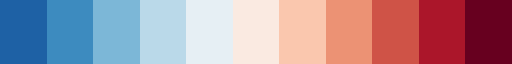

In [11]:
cmap = make_mycmap(cmap='RdBu_r', length=11, skew=1)
#cmap
color_list = [colors.rgb2hex(cmap(i)) for i in range(cmap.N)]
mycmap = colors.LinearSegmentedColormap.from_list('mycmap', color_list[:-1], len(color_list)-1)
mycmap

# to get rid of white if levels = odd ?
# maybe make a different make_my_cmap function that does this and use it automatically in plotting fxns 

In [99]:
def make_mycmap_nowhite(cmap='RdBu_r', length=11):
    cmap = make_mycmap(cmap='RdBu_r', length=21, skew=1)
    color_list = [colors.rgb2hex(cmap(i)) for i in range(cmap.N)]
    mycmap = colors.LinearSegmentedColormap.from_list('mycmap', color_list[:-1], len(color_list)-1)
    
    return mycmap

In [7]:
def plot_PR(PR_da, ax, cmap, bounds, title='short', smooth=False, mask=False):
    
    # copied this in functions.py can delete from here normally 


    cmap = cmap #try also RdBu_r
    crs = ccrs.PlateCarree()
    
    # define levels and cmap 
    ticks = levels = bounds 
    norm = colors.BoundaryNorm(levels, cmap.N)
    
    landmask = get_mask()
    
    # smooth and mask data
    if mask == True:
        if not smooth == False: # if smooth is not false, smooth the data 
            data = PR_da 
            sigma = smooth
            da_plot = gaussian_filter(data, sigma) * landmask # then mask it 
        else:
            data = da_plot = PR_da * landmask
    else: # if you dont want to mask it
        if not smooth == False: # if smooth is not false, smooth the data 
            data = PR_da 
            sigma = smooth
            da_plot = gaussian_filter(data, sigma)
        else:
            data = da_plot = PR_da   
    
    # set title
    if title == 'short':
        title = '{}'.format(GCM)
    if title == 'summary_stats':
        # get summary stats from unmasked and/or unsmoothed data 
        if mask == True:
            data_plot = data * landmask
        else:
            data_plot = data
        title = f'{GCM} \nmin, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f}'

        
    #plot
    plot = ax.contourf(data.lon, data.lat, da_plot, levels=levels, transform=crs, cmap=cmap, norm=norm, extend='both')
    
    # set title and coastlines
    ax.set_title(title)
    ax.coastlines(color='dimgray', linewidth=0.5)
    ax.set_facecolor('#f0f0f0')
    
    return plot 

## Test sensitivity of nAHD/PR/delta-I to different percentile thresholds 


### open data

In [3]:
# delta_I 
da_deltaI_TX90 = open_all_deltaI(GCMs, metric='TX90', outdirname='output_empirical',year_pres=2022, models=flags['models'])
da_deltaI_TX95 = open_all_deltaI(GCMs, metric='TX95', outdirname='output_empirical',year_pres=2022, models=flags['models'])
da_deltaI_TX99 = open_all_deltaI(GCMs, metric='TX99', outdirname='output_empirical',year_pres=2022, models=flags['models'])

In [4]:
# nADH
da_nAHD_TX90 = open_all_nAHD(GCMs, metric='TX90', outdirname='output_empirical',year_pres=2022)
da_nAHD_TX95 = open_all_nAHD(GCMs, metric='TX95', outdirname='output_empirical',year_pres=2022)
da_nAHD_TX99 = open_all_nAHD(GCMs, metric='TX99', outdirname='output_empirical',year_pres=2022)


In [5]:
# PR
da_PR_TX90 = open_all_PR(GCMs, metric='TX90', outdirname='output_empirical',year_pres=2022,models='ISIMIP3b')
da_PR_TX95 = open_all_PR(GCMs, metric='TX95', outdirname='output_empirical',year_pres=2022,models='ISIMIP3b')
da_PR_TX99 = open_all_PR(GCMs, metric='TX99', outdirname='output_empirical',year_pres=2022,models='ISIMIP3b')


In [6]:
# pre-industrial intensities 
da_pi_TX90 = open_all_TX_preindustrial(GCMs, metric='TX90', outdirname='output_empirical',models='ISIMIP3b')
da_pi_TX95 = open_all_TX_preindustrial(GCMs, metric='TX95', outdirname='output_empirical')
da_pi_TX99 = open_all_TX_preindustrial(GCMs, metric='TX99', outdirname='output_empirical')


### preview data

In [9]:
da_nAHD_TX95 #.isel(model=0)

<xarray.DataArray 'number of days' (model: 6, lat: 360, lon: 720)>
array([[[-3.494113  , -3.260957  , -3.1277251 , ..., -2.7946239 ,
         -2.7946239 , -2.8612397 ],
        [ 3.9337819 ,  3.9004738 ,  3.9004738 , ...,  4.2335753 ,
          3.80055   ,  4.2668834 ],
        [15.891713  , 15.95835   , 15.891713  , ..., 15.558633  ,
         15.825097  , 15.925042  ],
        ...,
        [15.092299  , 14.792528  , 15.625249  , ..., 15.29217   ,
         15.492017  , 15.1256075 ],
        [ 6.198811  ,  6.198811  ,  6.132195  , ...,  6.2987347 ,
          6.5651984 ,  6.5318904 ],
        [ 1.335695  ,  1.4689269 ,  1.1691551 , ...,  2.001876  ,
          1.6354667 ,  1.5355428 ]],

       [[36.048626  , 36.18188   , 35.98199   , ..., 36.41506   ,
         35.882065  , 36.18188   ],
        [52.60471   , 52.338203  , 52.571404  , ..., 52.43815   ,
         52.737965  , 52.404842  ],
        [47.408035  , 47.3414    , 47.30809   , ..., 47.3414    ,
         47.274784  , 47.3414    ],
...
        [11.728107  , 12.061188  , 11.628162  , ..., 12.02788   ,
         11.86134   , 11.894648  ],
        [18.123434  , 17.956873  , 18.090126  , ..., 18.35659   ,
         18.19005   , 18.223358  ],
        [ 4.500039  ,  4.6666007 ,  4.3001914 , ...,  4.566655  ,
          4.3001914 ,  4.566655  ]],

       [[13.5296755 , 13.463059  , 13.363113  , ..., 13.5963125 ,
         13.429751  , 13.463059  ],
        [34.24978   , 34.216473  , 34.38301   , ..., 34.216473  ,
         33.983273  , 34.18314   ],
        [26.454758  , 26.58801   , 26.35481   , ..., 26.18825   ,
         26.254887  , 26.42145   ],
        ...,
        [10.198486  , 10.131849  , 10.29841   , ..., 10.664842  ,
         10.098541  , 10.331718  ],
        [19.359287  , 19.492542  , 19.159418  , ..., 19.192726  ,
         19.492542  , 19.392595  ],
        [ 3.7026277 ,  3.7692654 ,  3.6360116 , ...,  3.9024973 ,
          3.7692654 ,  3.9691348 ]]], dtype=float32)
Coordinates:
  * lon      (lon) float64 -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8
  * lat      (lat) float64 89.75 89.25 88.75 88.25 ... -88.75 -89.25 -89.75
  * model    (model) <U12 'CanESM5' 'CNRM-CM6-1' ... 'MIROC6' 'MRI-ESM2-0'

## 0. plot baseline TX90, TX95, TX99

Baseline pre-industrial TX99 is about 30-35 deg over most of Europe, reaching 35-40 deg over Spain and certain other areas. In northern Europe/Scandinavia/UK it goes from 25-30 deg to 20-25 deg in higher lats. North Africa goes from 35-40 deg near the coast to 40-45 deg more inland. 

*Description* Baseline pre-industrial TX99 is about 30-35 deg over most of Europe, reaching 35-40 deg over Spain and certain other areas. In northern Europe/Scandinavia/UK it goes from 25-30 deg to 20-25 deg in higher lats. North Africa goes from 35-40 deg near the coast to 40-45 deg more inland. 

To do:
- do this in observations! Will be more informative, possibly, if I can detrend the warming 

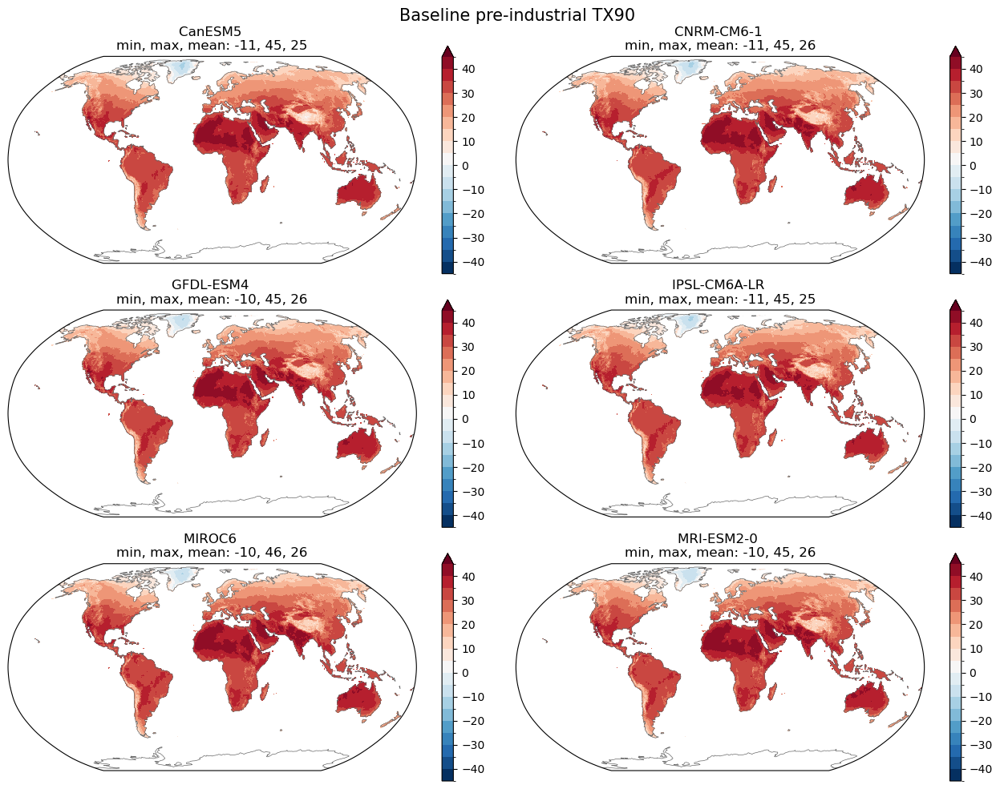

In [7]:
proj = ccrs.Robinson()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 45
levels = np.linspace(-vmax,vmax,num=19)

fig, axes = plt.subplots(3,2,figsize=(13,10), subplot_kw={'projection': proj})
axes = axes.flatten() 

for GCM, ax in zip(GCMs, axes):
    data_plot = (da_pi_TX90.sel(model=GCM)*landmask - 273.15)
    data_plot.plot(ax=ax, cmap = 'RdBu_r', vmax=vmax, transform=crs, levels=levels, extend='max') 
    ax.set_title(f'{GCM} \nmin, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f}')
    ax.coastlines(color='dimgray', linewidth=0.5)
    #ax.add_feature(cfeature.BORDERS, facecolor="none", edgecolor='dimgray', linewidth=0.5 )
    
fig.suptitle('Baseline pre-industrial TX90', size=15);
fig.tight_layout()


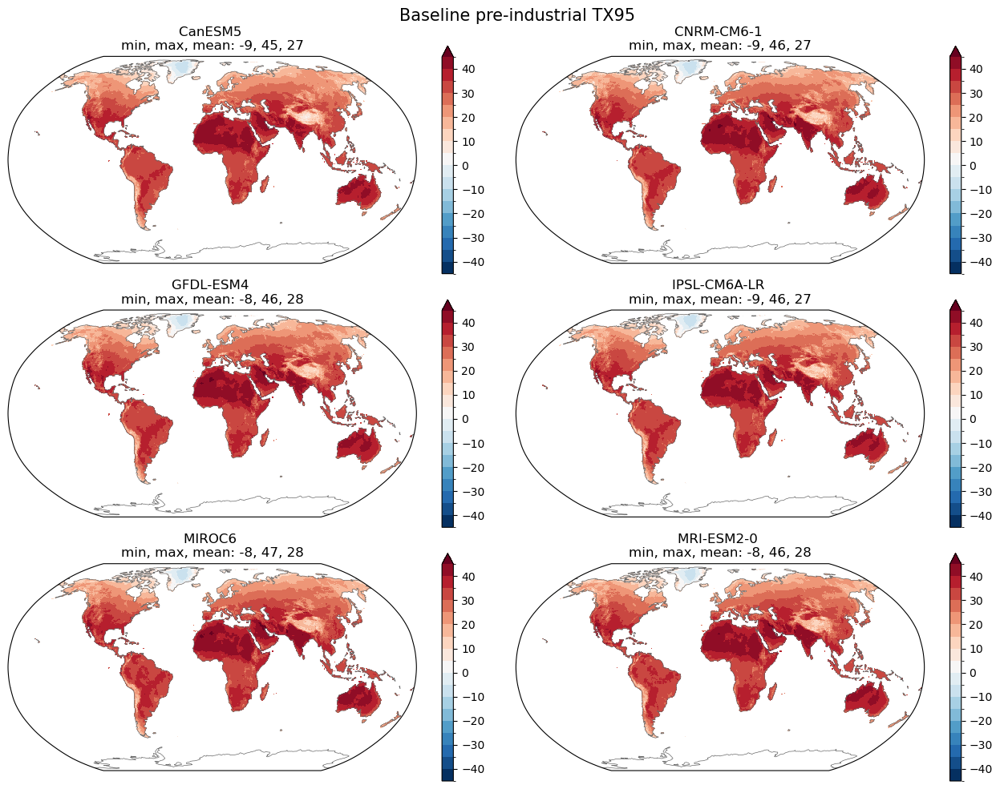

In [8]:
proj = ccrs.Robinson()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 45
levels = np.linspace(-vmax,vmax,num=19)

fig, axes = plt.subplots(3,2,figsize=(13,10), subplot_kw={'projection': proj})
axes = axes.flatten() 

for GCM, ax in zip(GCMs, axes):
    data_plot = (da_pi_TX95.sel(model=GCM)*landmask - 273.15)
    data_plot.plot(ax=ax, cmap = 'RdBu_r', vmax=vmax, transform=crs, levels=levels,extend='max') #legend='degC'
    ax.set_title(f'{GCM} \nmin, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f}')
    ax.coastlines(color='dimgray', linewidth=0.5)
    #ax.add_feature(cfeature.BORDERS, facecolor="none", edgecolor='dimgray', linewidth=0.5 )
    
fig.suptitle('Baseline pre-industrial TX95', size=15);
fig.tight_layout()

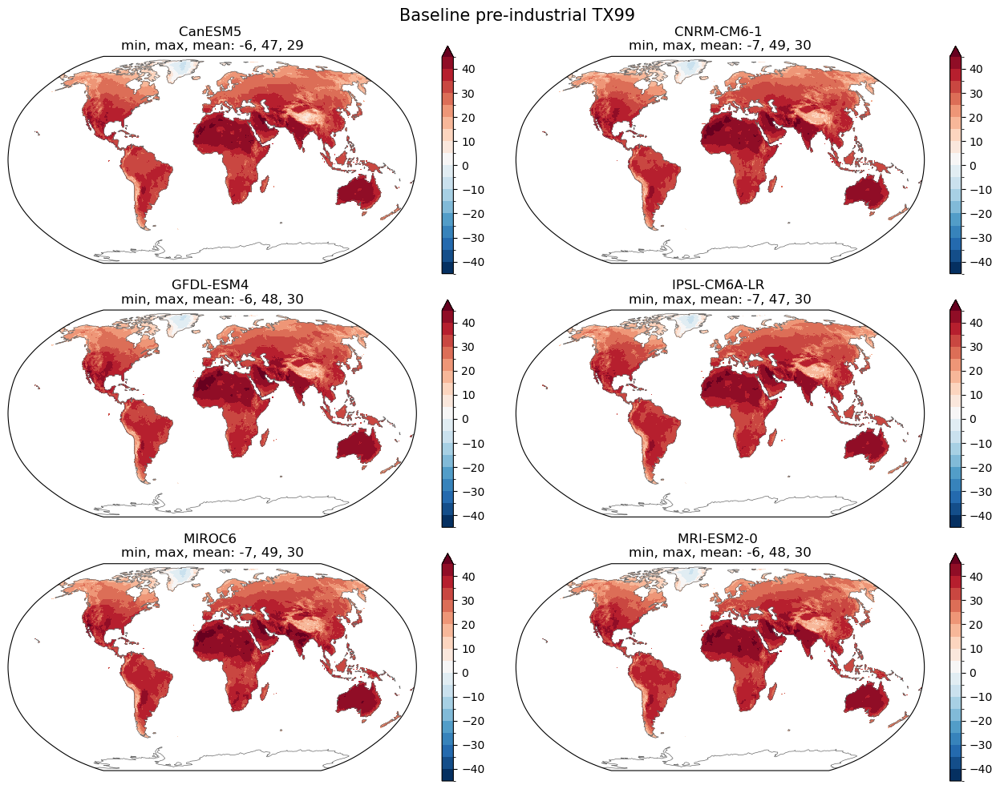

In [9]:
proj = ccrs.Robinson()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 45
levels = np.linspace(-vmax,vmax,num=19)


fig, axes = plt.subplots(3,2,figsize=(13,10), subplot_kw={'projection': proj})
axes = axes.flatten() 

for GCM, ax in zip(GCMs, axes):
    data_plot = (da_pi_TX99.sel(model=GCM)*landmask - 273.15)
    data_plot.plot(ax=ax, cmap = 'RdBu_r', vmax=vmax, transform=crs, levels=levels,extend='max')
    ax.set_title(f'{GCM} \nmin, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f}')
    ax.coastlines(color='dimgray', linewidth=0.5)
    #ax.add_feature(cfeature.BORDERS, facecolor="none", edgecolor='dimgray', linewidth=0.5 )
    
fig.suptitle('Baseline pre-industrial TX99', size=15);
fig.tight_layout()

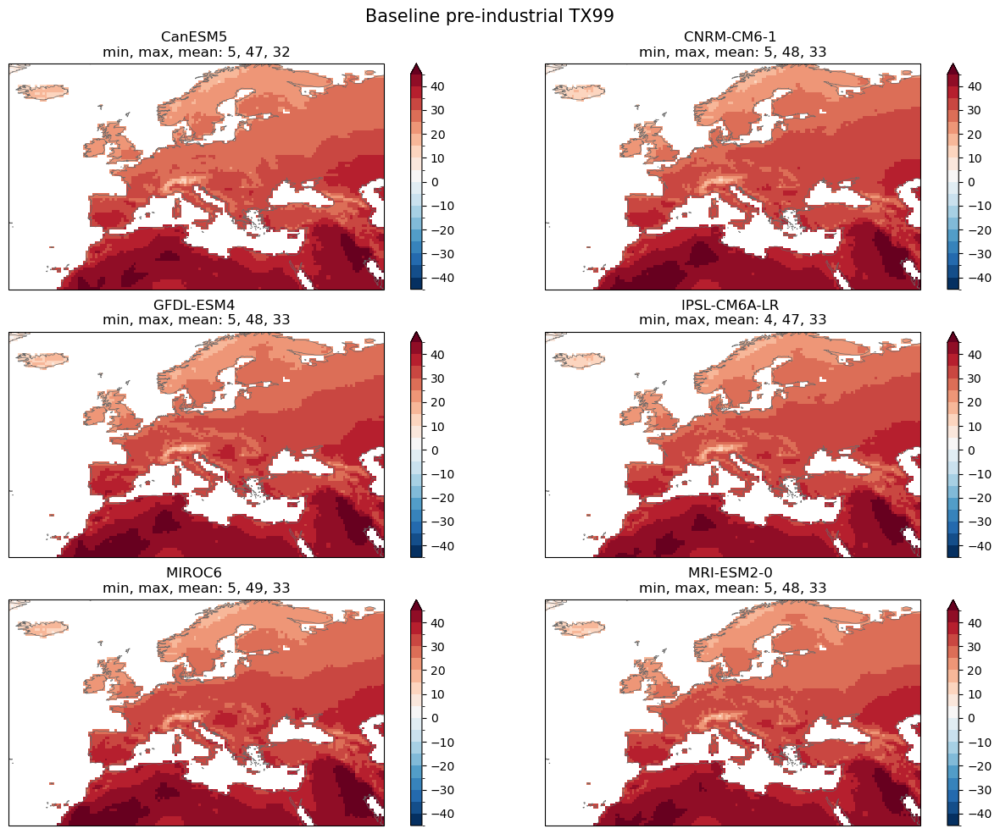

In [10]:
proj = ccrs.PlateCarree()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 45
levels = np.linspace(-vmax,vmax,num=19)


fig, axes = plt.subplots(3,2,figsize=(13,10), subplot_kw={'projection': proj})
axes = axes.flatten() 

for GCM, ax in zip(GCMs, axes):
    data_plot = (da_pi_TX99.sel(model=GCM)*landmask - 273.15).sel(lat=slice(71,24), lon=slice(-26,52))
    data_plot.plot(ax=ax, cmap = 'RdBu_r', vmax=vmax, transform=crs, levels=levels,extend='max')
    ax.set_title(f'{GCM} \nmin, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f}')
    ax.coastlines(color='dimgray', linewidth=0.5)
    #ax.add_feature(cfeature.BORDERS, facecolor="none", edgecolor='dimgray', linewidth=0.5 )
    
fig.suptitle('Baseline pre-industrial TX99', size=15);
fig.tight_layout()

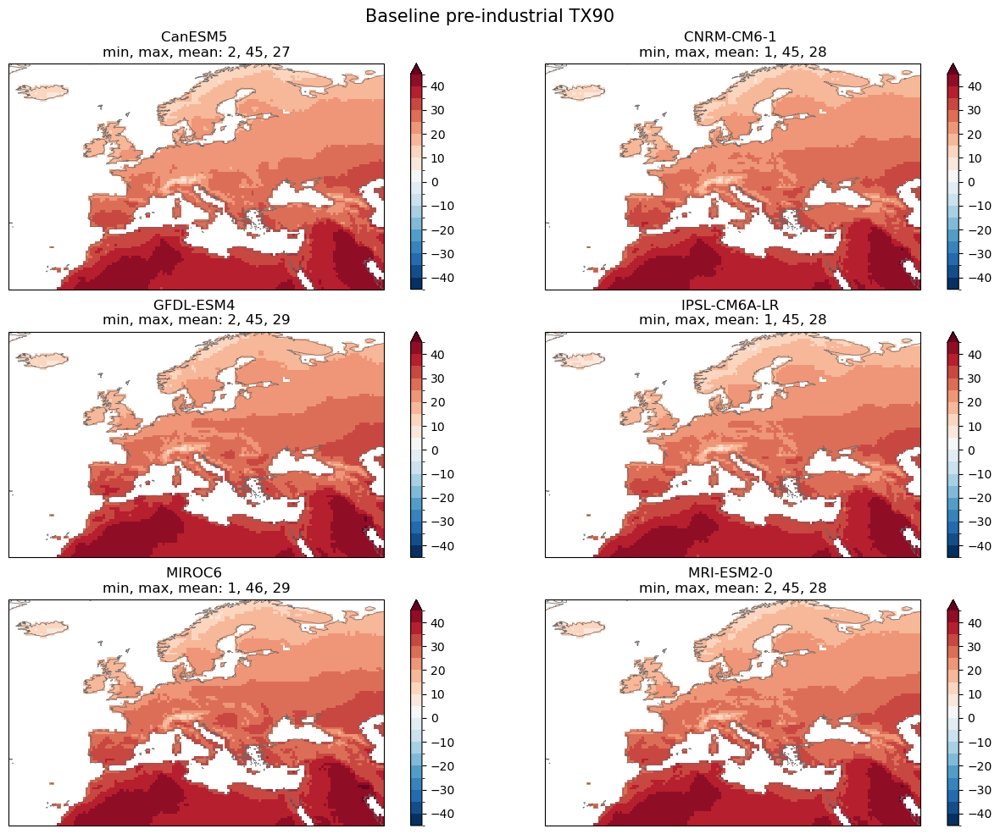

In [11]:
proj = ccrs.PlateCarree()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 45
levels = np.linspace(-vmax,vmax,num=19)


fig, axes = plt.subplots(3,2,figsize=(13,10), subplot_kw={'projection': proj})
axes = axes.flatten() 

for GCM, ax in zip(GCMs, axes):
    data_plot = (da_pi_TX90.sel(model=GCM)*landmask - 273.15).sel(lat=slice(71,24), lon=slice(-26,52))
    data_plot.plot(ax=ax, cmap = 'RdBu_r', vmax=vmax, transform=crs, levels=levels,extend='max')
    ax.set_title(f'{GCM} \nmin, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f}')
    ax.coastlines(color='dimgray', linewidth=0.5)
    #ax.add_feature(cfeature.BORDERS, facecolor="none", edgecolor='dimgray', linewidth=0.5 )
    
fig.suptitle('Baseline pre-industrial TX90', size=15);
fig.tight_layout()

## 1. Test sensitivity of nAHD to different percentile thresholds

Memo:
- improve these plots, set the same cbar, have only one cbar per figure

### 1a. nAHD: spatial patterns TX90, TX95 and TX99

The spatial patterns are similar, the absolute number of nAHD increases by factor 1-4 in most places from TX99 to TX90. Larger numbers for ratio in areas with very small denominator (nAHD99).

Memo
- could calculate aggregate statistics per country 


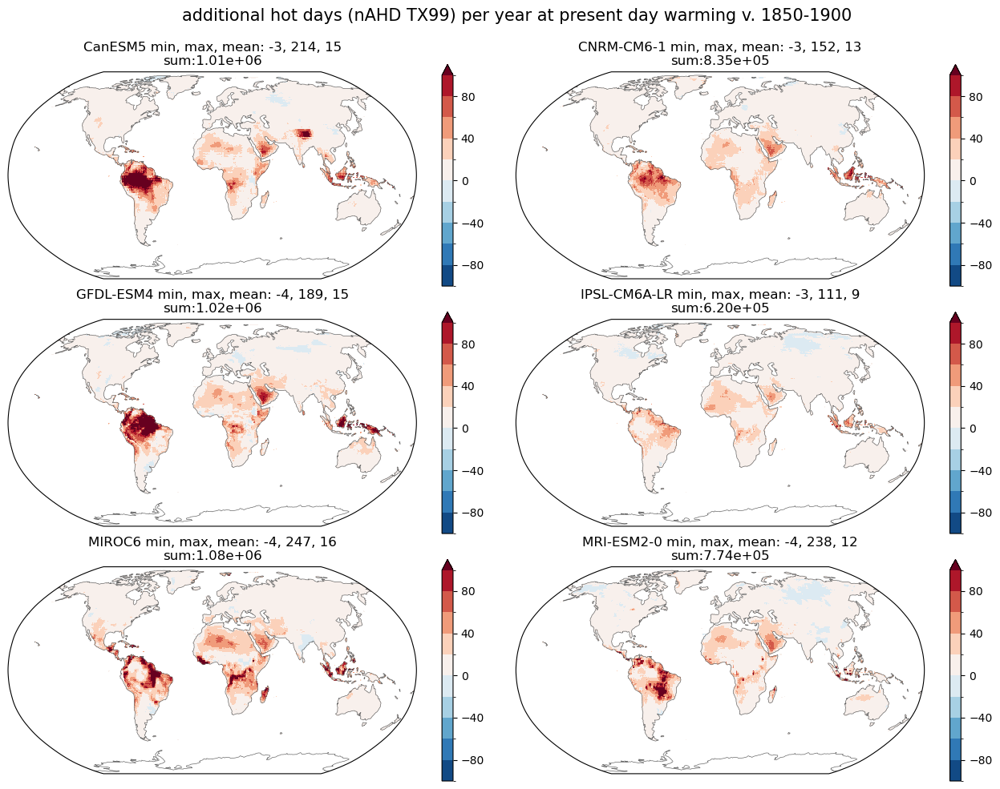

In [19]:
proj = ccrs.Robinson()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 100
vmin = -vmax

#axes = [plt.subplot(321, projection=proj), plt.subplot(322, projection=proj), plt.subplot(323, projection=proj),
#       plt.subplot(324, projection=proj), plt.subplot(325, projection=proj), plt.subplot(326, projection=proj)]

fig, axes = plt.subplots(3,2,figsize=(13,10), subplot_kw={'projection': proj})
axes = axes.flatten() 

for GCM, ax in zip(GCMs, axes):
    data_plot = da_nAHD_TX99.sel(model=GCM)*landmask 
    data_plot.plot(ax=ax, cmap = mycmap, vmax=vmax, vmin=vmin, transform=crs, levels=11) #legend='additional hot days' on cbar
    ax.set_title(f'{GCM} min, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f}'
                f'\nsum:{data_plot.sum():.2e}')
    ax.coastlines(color='dimgray', linewidth=0.5)
    #ax.add_feature(cfeature.BORDERS, facecolor="none", edgecolor='dimgray', linewidth=0.5 )
    
fig.suptitle('additional hot days (nAHD TX99) per year at present day warming v. 1850-1900\n', size=15);
fig.tight_layout()


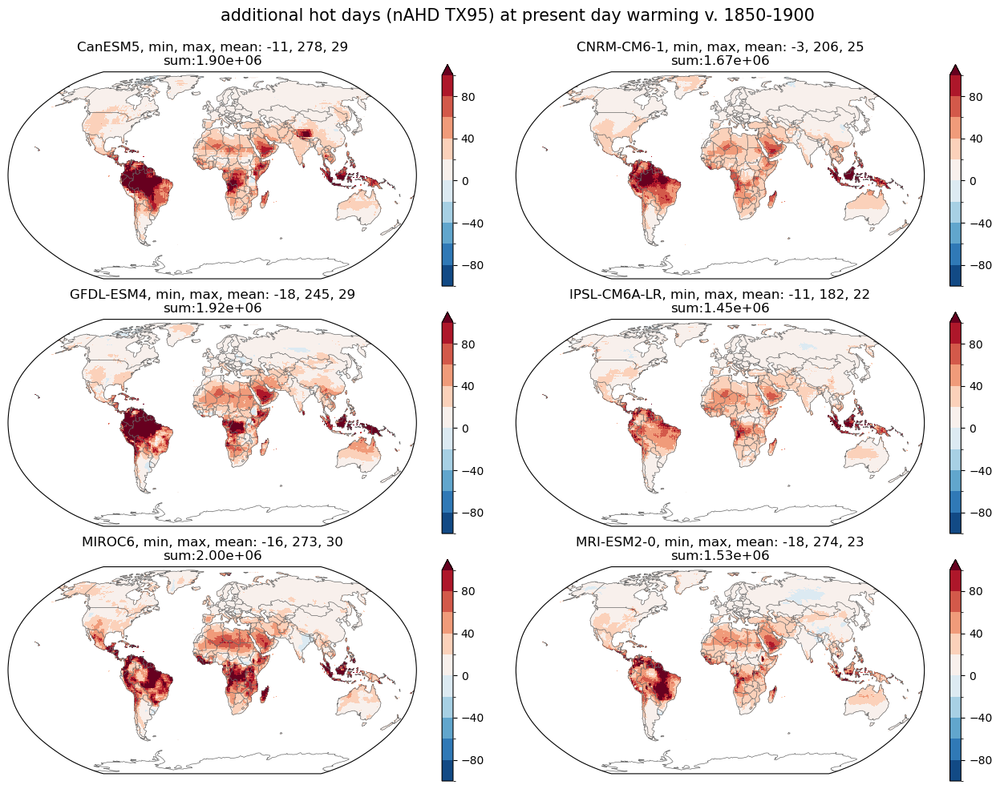

In [20]:
proj = ccrs.Robinson()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 100 #200
vmin = -vmax

fig, axes = plt.subplots(3,2,figsize=(13,10), subplot_kw={'projection': proj})
axes = axes.flatten()

for GCM, ax in zip(GCMs, axes):
    data_plot = da_nAHD_TX95.sel(model=GCM)*landmask
    data_plot.plot(ax=ax, cmap = mycmap, vmax=vmax, vmin=vmin, transform=crs, levels=11 ) #cmap = 'RdBu_r', vmax=250, vmin=-250, transform=crs
    ax.set_title(f'{GCM}, min, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f}'
                f'\nsum:{data_plot.sum():.2e}')
    ax.coastlines(color='dimgray', linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, facecolor="none", edgecolor='dimgray', linewidth=0.5 )
    

fig.suptitle('additional hot days (nAHD TX95) at present day warming v. 1850-1900\n', size=15)
fig.tight_layout()

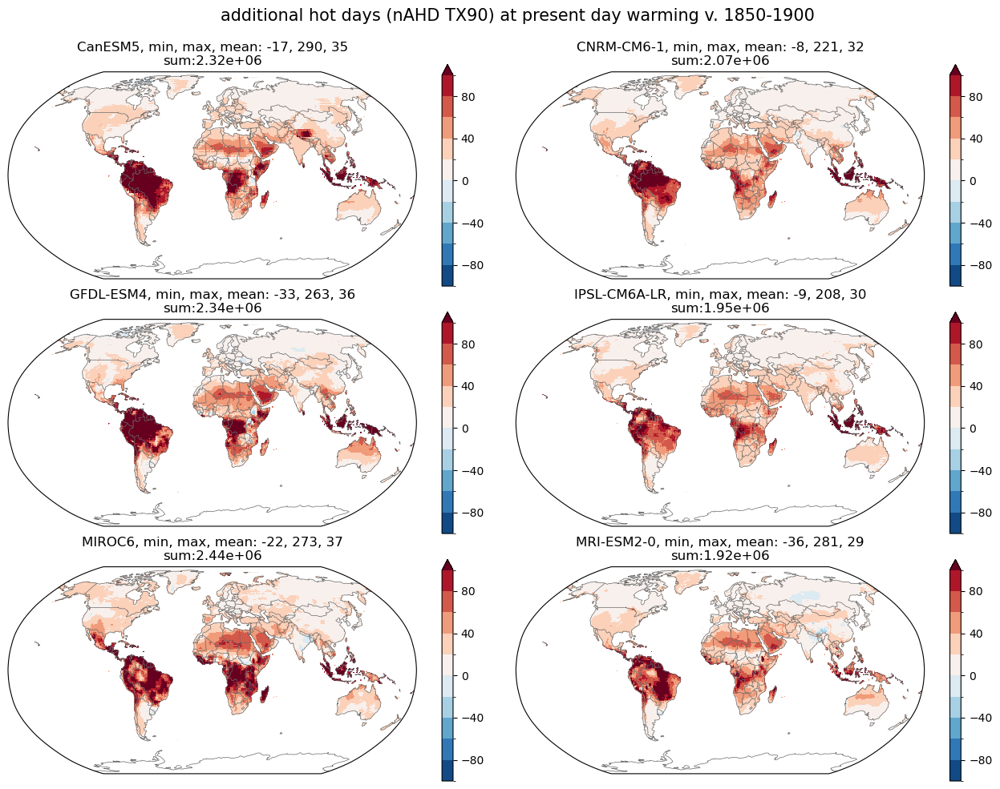

In [21]:
proj = ccrs.Robinson()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 100 #200
vmin = -vmax

fig, axes = plt.subplots(3,2,figsize=(13,10), subplot_kw={'projection': proj})
axes = axes.flatten()

for GCM, ax in zip(GCMs, axes):
    data_plot = da_nAHD_TX90.sel(model=GCM)*landmask
    data_plot.plot(ax=ax, cmap = mycmap, vmax=vmax, vmin=vmin, transform=crs, levels=11 ) #cmap = 'RdBu_r', vmax=250, vmin=-250, transform=crs
    ax.set_title(f'{GCM}, min, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f}'
                f'\nsum:{data_plot.sum():.2e}')
    ax.coastlines(color='dimgray', linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, facecolor="none", edgecolor='dimgray', linewidth=0.5 )
    

fig.suptitle('additional hot days (nAHD TX90) at present day warming v. 1850-1900\n', size=15)
fig.tight_layout()


#### o. plot for BCC conference

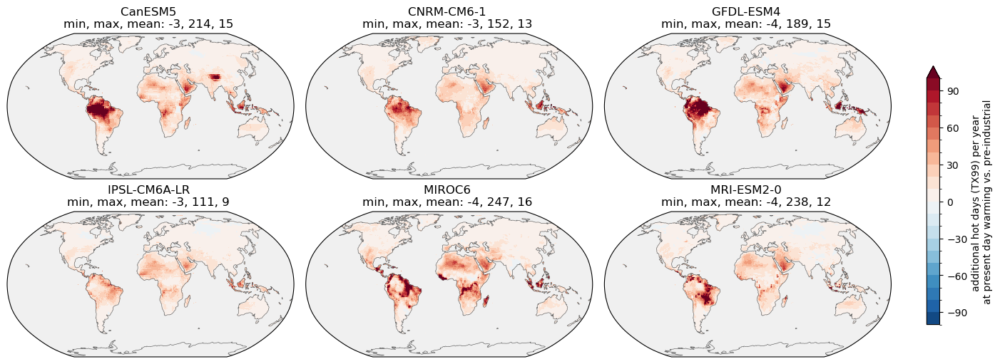

In [30]:
# option 1. regular plot
# why are colors lighter??


proj = ccrs.Robinson()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 100
vmin = -4 
nlevels=21
mycmap = 'RdBu_r'# make_mycmap_nowhite(cmap='RdBu_r', length=nlevels+2)
whiteonblack = True  
annotate = True 


# set colors 
if whiteonblack == False:
    fg_color = 'white'
else:
    fg_color = 'k' 
    

#plot 
fig, axes = plt.subplots(2,3,figsize=(14,5), subplot_kw={'projection': proj}, layout='constrained')
axes = axes.flatten() 

for GCM, ax in zip(GCMs, axes):
    # set data and title
    data_plot = da_nAHD_TX99.sel(model=GCM)*landmask 
    if annotate == True:
        title = f'{GCM} \nmin, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f} ' # \nsum:{data_plot.sum():.2e}
    else:
        title = f'{GCM}'
    # plot
    plot = data_plot.plot(ax=ax, cmap = mycmap, vmax=vmax, transform=crs, levels=nlevels, add_colorbar=False, extend='both') 
    ax.set_title(title, color=fg_color) 
    ax.coastlines(color='dimgray', linewidth=0.5)
    ax.set_facecolor('#f0f0f0')
    
    for spine in plot.axes.spines.values():
        spine.set_edgecolor(fg_color)   
    
cb = fig.colorbar(plot, extend='max', ax=axes, shrink=0.8, location='right', fraction= 0.045, pad= 0.04)

# change colors of stuff for white on black option 
cb.set_label('additional hot days (TX99) per year \nat present day warming vs. pre-industrial', color=fg_color)
cb.ax.yaxis.set_tick_params(color=fg_color)
cb.outline.set_edgecolor(fg_color)
plt.setp(plt.getp(cb.ax.axes, 'yticklabels'), color=fg_color);

# save figure
#plt.savefig(os.path.join(figdir,'nAHD_TX99_map_bw_annotate.png'), dpi=300, transparent=False)

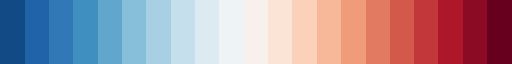

In [27]:
mycmap

/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/coding/times.py:682: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(array[self.key], dtype=None)


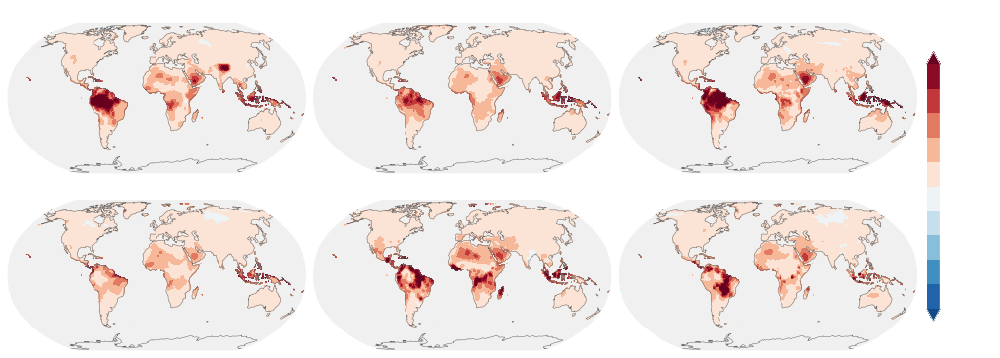

In [18]:
# option 2. contourf/smoothing 


proj = ccrs.Robinson()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 100
vmin = -4 
nlevels=11
mycmap = make_mycmap_nowhite(cmap='RdBu_r', length=nlevels)
whiteonblack = True  
sigma = 1.2
levels = np.linspace(-vmax, vmax, nlevels)
annotate = False

# set colors 
if whiteonblack == True:
    fg_color = 'white'
else:
    fg_color = 'k' 

#plot 
fig, axes = plt.subplots(2,3,figsize=(14,5), subplot_kw={'projection': proj}, layout='constrained')
axes = axes.flatten() 

for GCM, ax in zip(GCMs, axes):
    data = da_nAHD_TX99.sel(model=GCM)
    data_plot = gaussian_filter(data, sigma) * landmask # then mask it 
    plot = ax.contourf(data.lon, data.lat, data_plot, vmax=vmax, vmin=-vmax, transform=crs, levels=levels, cmap=mycmap, extend='both') #add_colorbar=False cmap = mycmap, 
    
    #title 
    if annotate == True:
        title = f'{GCM} \nmin, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f} \nsum:{data_plot.sum():.2e}'
    else:
        title = f'{GCM}'
    
    ax.set_title(title, color=fg_color) 
    ax.coastlines(color='dimgray', linewidth=0.5)
    ax.set_facecolor('#f0f0f0')
    
    # check
    #plt.colorbar(plot, extend='max',ax=ax)
    
    for spine in plot.axes.spines.values():
        spine.set_edgecolor(fg_color)   
    
cb = fig.colorbar(plot, extend='max', ax=axes, shrink=0.8, location='right', fraction= 0.045, pad= 0.01) # incr pad to increase space figs and cbar

# change colors of stuff for white on black option 
cb.set_label('additional hot days (TX99) per year \nat present day warming vs. pre-industrial', color=fg_color)
cb.ax.yaxis.set_tick_params(color=fg_color)
cb.outline.set_edgecolor(fg_color)
plt.setp(plt.getp(cb.ax.axes, 'yticklabels'), color=fg_color);


# save figure
#plt.savefig(os.path.join(figdir,'nAHD_TX99_map_contourf_bw_annotated'), dpi=300, transparent=False)


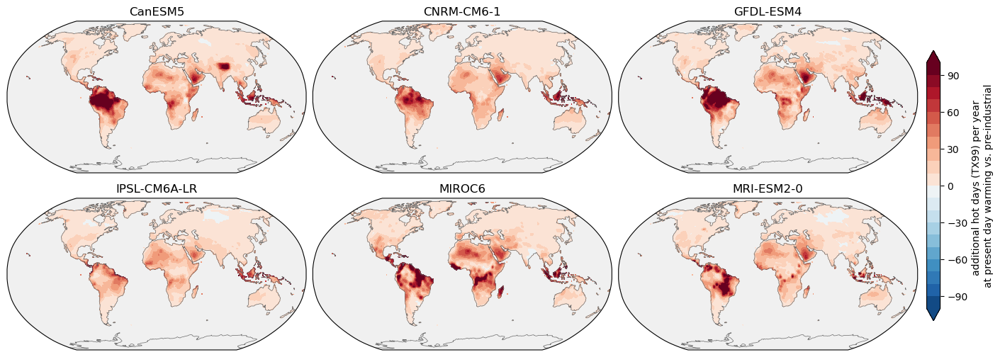

In [23]:
# option 2. contourf/smoothing - black


proj = ccrs.Robinson()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 100
vmin = -4 
nlevels=21
mycmap = make_mycmap_nowhite(cmap='RdBu_r', length=nlevels)
whiteonblack = True  
sigma = 1.2
levels = np.linspace(-vmax, vmax, nlevels)

# set colors 
if whiteonblack == False:
    fg_color = 'white'
else:
    fg_color = 'k' 

#plot 
fig, axes = plt.subplots(2,3,figsize=(14,5), subplot_kw={'projection': proj}, layout='constrained')
axes = axes.flatten() 

for GCM, ax in zip(GCMs, axes):
    data = da_nAHD_TX99.sel(model=GCM)
    data_plot = gaussian_filter(data, sigma) * landmask # then mask it 
    plot = ax.contourf(data.lon, data.lat, data_plot, vmax=vmax, vmin=-vmax, transform=crs, levels=levels, cmap=mycmap, extend='both') #add_colorbar=False cmap = mycmap, 
    ax.set_title(f'{GCM}', color=fg_color) 
    ax.coastlines(color='dimgray', linewidth=0.5)
    ax.set_facecolor('#f0f0f0')
    
    # check
    #plt.colorbar(plot, extend='max',ax=ax)
    
    for spine in plot.axes.spines.values():
        spine.set_edgecolor(fg_color)   
    
cb = fig.colorbar(plot, extend='max', ax=axes, shrink=0.8, location='right', fraction= 0.045, pad= 0.01) # incr pad to increase space figs and cbar

# change colors of stuff for white on black option 
cb.set_label('additional hot days (TX99) per year \nat present day warming vs. pre-industrial', color=fg_color)
cb.ax.yaxis.set_tick_params(color=fg_color)
cb.outline.set_edgecolor(fg_color)
plt.setp(plt.getp(cb.ax.axes, 'yticklabels'), color=fg_color);


# save figure
#plt.savefig(os.path.join(figdir,'nAHD_TX99_map_contourf_bw_morelevs'), dpi=300, transparent=False)


In [24]:
figdir

'/data/brussel/vo/000/bvo00012/vsc10419/attr-hw/figures/fig_feb24_isimip3b-climate-signal'

#### i. compare spatial patterns: difference and ratio maps

Mostly nAHDTX90 (p1-p0) is greater than nAHDTX99, usually by a factor of 1-4. Mostly these two values are positive everywhere. In the places where they are negative the magnitudes are small (e.g. max -4) and these occur only in certain models/locations. In some places where nAHDTX99 has a very small magnitude (pos or neg) the ratio of nAHD90/nAHD99 balloons to large numbers but these are not very meaningful.

Generally, nAHD90 > nAHD95 > nAHD99. With the greatest increase in the tropics in places that have high nAHD to begin with. 

Mostly nAHDTX90 (and therefore p1-p0 for TX90) is greater than nAHDTX99, usually by a factor of 1-4, with a lot of 2-4. Mostly nAHDTX95 (and therefore p1-p0 for TX95) is greater than nAHDTX99, by a factor of 1-4, with a lot of 1-2. 

Mostly these values (nAHD90, nAHD95 nAHD99) are positive everywhere, indicating an increase in the likelihood of hot days. In the places where they are negative, i.e. indicating a decrease in hot days, the magnitudes are small (e.g. max -4 for TX99) and occur only in certain models/locations.

*potentially understand a bit better why negative those models/locations - is it generally a representation of cooling in these places e.g. due to irrigation or is it just the tails becoming less heavy? e.g. also irrigation or other mechanisms??*

Memo:
- test sensitivity in demographics to masking out places where nAHD is negative versus not masking it

/apps/brussel/RL8/skylake/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/coding/times.py:682: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/apps/brussel/RL8/skylake/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(array[self.key], dtype=None)


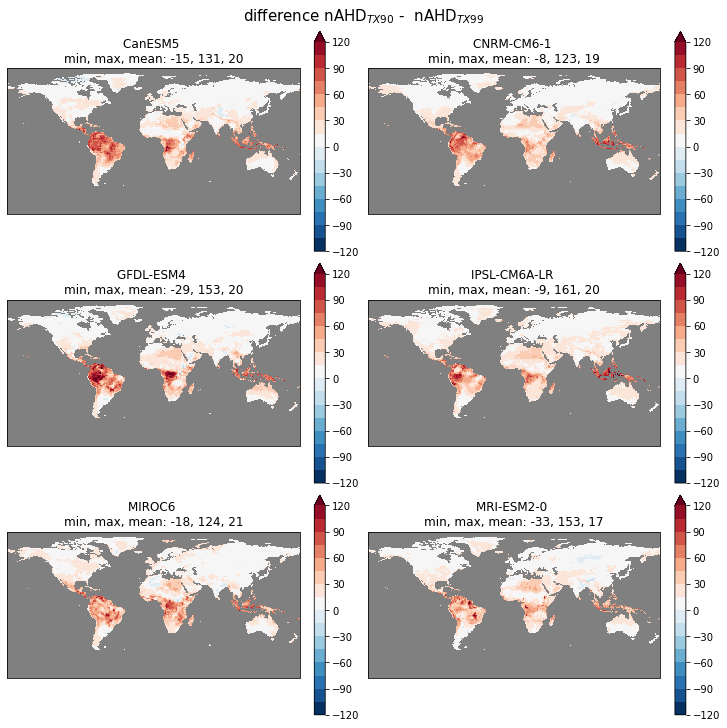

In [106]:
proj = ccrs.PlateCarree() #ccrs.Robinson()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 120

fig, axes = plt.subplots(3, 2, figsize=(10,10), layout='constrained', subplot_kw={'projection': proj})

for GCM, ax in zip(GCMs, axes.flat):
    data_plot = (da_nAHD_TX90.sel(model=GCM) - da_nAHD_TX99.sel(model=GCM))*landmask 
    data_plot.plot(ax=ax,vmax=vmax,levels=17, cmap='RdBu_r')
    ax.set_facecolor('gray')
    ax.set_title(f'{GCM} \nmin, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f}')

fig.suptitle('difference nAHD$_{TX90}$ -  nAHD$_{TX99}$', size=15);
#cbar = fig.colorbar(plot, extend='both', ax=axes[-1,:], location='bottom') 
#cbar.set_label(label='number of days')

/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/coding/times.py:682: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(array[self.key], dtype=None)


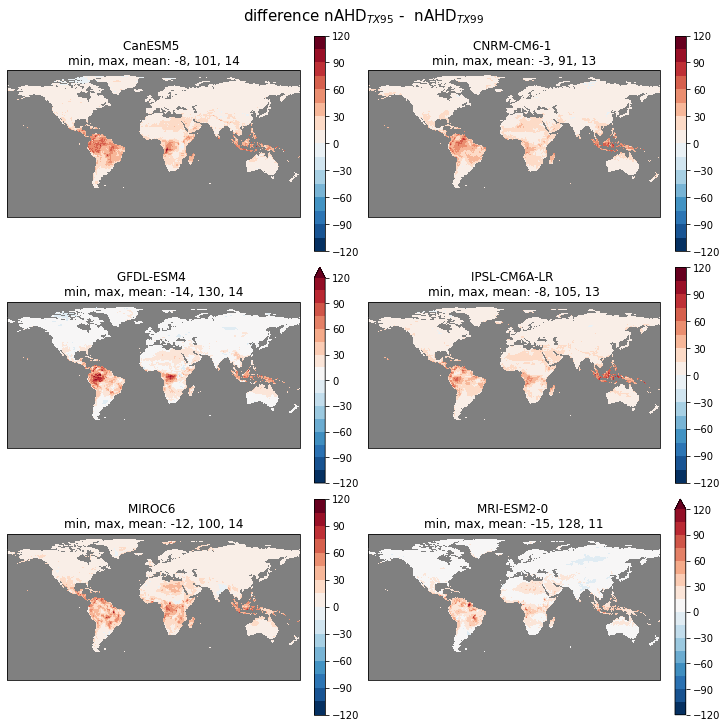

In [16]:
proj = ccrs.PlateCarree() #ccrs.Robinson()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 120

fig, axes = plt.subplots(3, 2, figsize=(10,10), layout='constrained', subplot_kw={'projection': proj})

for GCM, ax in zip(GCMs, axes.flat):
    data_plot = (da_nAHD_TX95.sel(model=GCM) - da_nAHD_TX99.sel(model=GCM))*landmask 
    data_plot.plot(ax=ax,vmax=vmax,levels=17, cmap='RdBu_r')
    ax.set_facecolor('gray')
    ax.set_title(f'{GCM} \nmin, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f}')

fig.suptitle('difference nAHD$_{TX95}$ -  nAHD$_{TX99}$', size=15);

# possibly calc per country averages of stuff? 

Description: Generally, nAHD90 > nAHD95 > nAHD99. With the greatest increase in the tropics in places that have high nAHD to begin with. 

/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/coding/times.py:682: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(array[self.key], dtype=None)


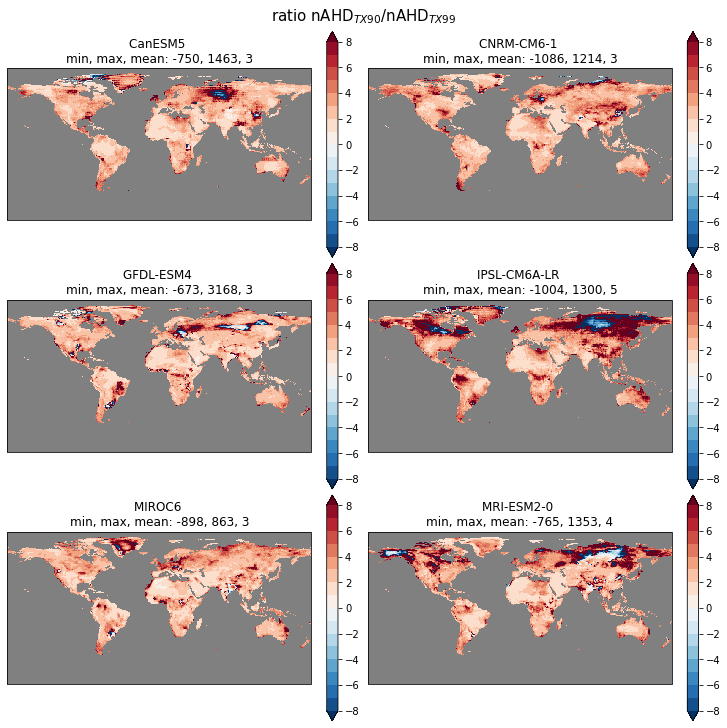

In [17]:
proj = ccrs.PlateCarree() #ccrs.Robinson()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 4 #100

fig, axes = plt.subplots(3, 2, figsize=(10,10), layout='constrained', subplot_kw={'projection': proj})

for GCM, ax in zip(GCMs, axes.flat):
    data_plot = (da_nAHD_TX90.sel(model=GCM) / da_nAHD_TX99.sel(model=GCM))*landmask 
    data_plot.plot(ax=ax,vmax=8,levels=17, cmap='RdBu_r')
    ax.set_facecolor('gray')
    ax.set_title(f'{GCM} \nmin, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f}')

fig.suptitle('ratio nAHD$_{TX90}$/nAHD$_{TX99}$', size=15);
#cbar = fig.colorbar(plot, extend='both', ax=axes[-1,:], location='bottom') 
#cbar.set_label(label='number of days')

/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/coding/times.py:682: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(array[self.key], dtype=None)


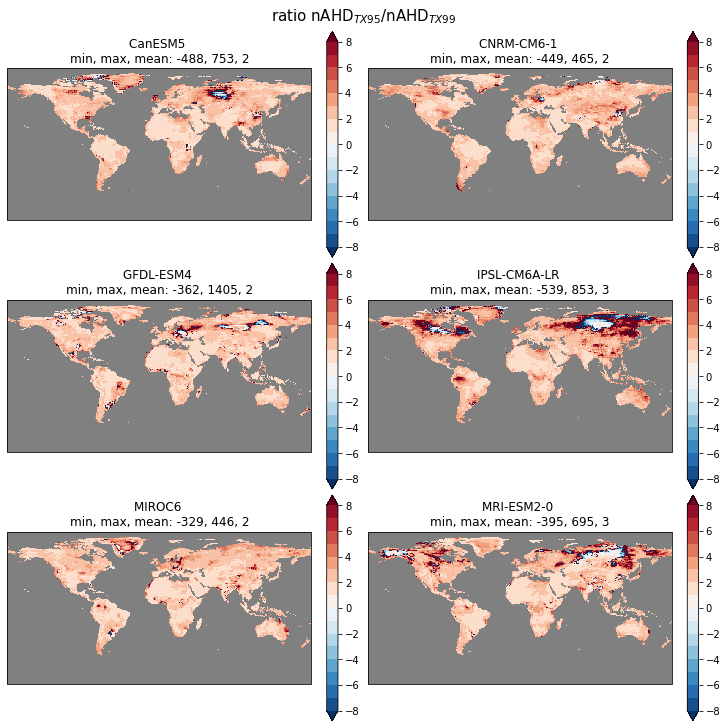

In [18]:
proj = ccrs.PlateCarree() #ccrs.Robinson()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 4 #100

fig, axes = plt.subplots(3, 2, figsize=(10,10), layout='constrained', subplot_kw={'projection': proj})

for GCM, ax in zip(GCMs, axes.flat):
    data_plot = (da_nAHD_TX95.sel(model=GCM) / da_nAHD_TX99.sel(model=GCM))*landmask 
    data_plot.plot(ax=ax,vmax=8,levels=17, cmap='RdBu_r')
    ax.set_facecolor('gray')
    ax.set_title(f'{GCM} \nmin, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f}')

fig.suptitle('ratio nAHD$_{TX95}$/nAHD$_{TX99}$', size=15);

/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/coding/times.py:682: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(array[self.key], dtype=None)


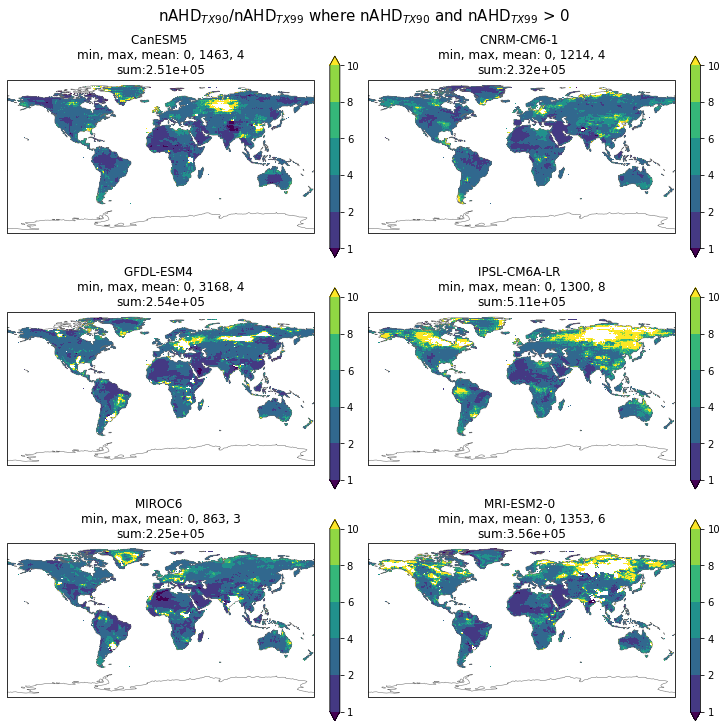

In [23]:
proj = ccrs.PlateCarree() #ccrs.Robinson()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 4 #100

fig, axes = plt.subplots(3, 2, figsize=(10,10), layout='constrained', subplot_kw={'projection': proj})

for GCM, ax in zip(GCMs, axes.flat):
    data_plot = (da_nAHD_TX90.sel(model=GCM) / da_nAHD_TX99.sel(model=GCM))*landmask 
    data_plot = data_plot.where(da_nAHD_TX90.sel(model=GCM)>0).where(da_nAHD_TX99.sel(model=GCM)>0) #.where(data_plot>1)
    #data_plot.plot(ax=ax,vmax=8,levels=8, cmap='Reds')
    data_plot.plot(ax=ax,levels=[1,2,4,6,8,10],cmap='viridis')
    ax.set_title(f'{GCM} \nmin, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f}'
    f'\nsum:{data_plot.sum():.2e}')
    ax.coastlines(color='dimgray', linewidth=0.5)


fig.suptitle('nAHD$_{TX90}$/nAHD$_{TX99}$ where nAHD$_{TX90}$ and nAHD$_{TX99}$ > 0', size=15);
#cbar = fig.colorbar(plot, extend='both', ax=axes[-1,:], location='bottom') 
#cbar.set_label(label='number of days')

# understand if doing this makes sense !!! 

#plt.savefig(os.path.join(figdir,'nAHD_ratio_TX90_TX99_annotate.png'), dpi=300, transparent=False)

Description: Mostly nAHDTX90 (and therefore p1-p0 for TX90) is greater than nAHDTX99, usually by a factor of 1-4, with a lot of 2-4.

/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/coding/times.py:682: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(array[self.key], dtype=None)


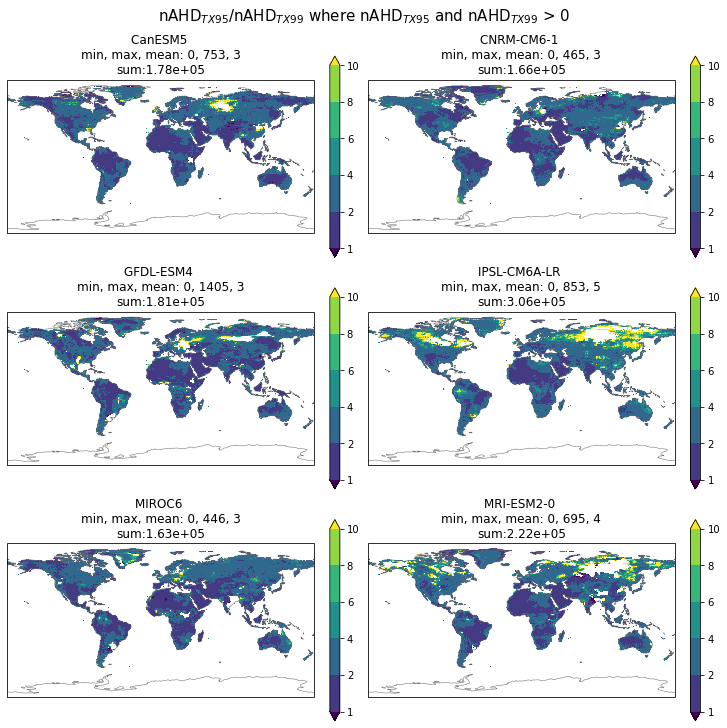

In [25]:
proj = ccrs.PlateCarree() #ccrs.Robinson()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 4 #100

fig, axes = plt.subplots(3, 2, figsize=(10,10), layout='constrained', subplot_kw={'projection': proj})

for GCM, ax in zip(GCMs, axes.flat):
    data_plot = (da_nAHD_TX95.sel(model=GCM) / da_nAHD_TX99.sel(model=GCM))*landmask 
    data_plot = data_plot.where(da_nAHD_TX95.sel(model=GCM)>0).where(da_nAHD_TX99.sel(model=GCM)>0) #where(data_plot>1) #.where(data_plot<10)
    #data_plot.plot(ax=ax,vmax=8,levels=8, cmap='Reds')
    data_plot.plot(ax=ax,levels=[1,2,4,6,8,10],cmap='viridis')
    ax.set_title(f'{GCM} \nmin, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f}'
    f'\nsum:{data_plot.sum():.2e}')
    ax.coastlines(color='dimgray', linewidth=0.5)


fig.suptitle('nAHD$_{TX95}$/nAHD$_{TX99}$ where nAHD$_{TX95}$ and nAHD$_{TX99}$ > 0', size=15);

#plt.savefig(os.path.join(figdir,'nAHD_ratio_TX95_TX99_annotate.png'), dpi=300, transparent=False)

Description: Mostly nAHDTX95 (and therefore p1-p0 for TX95) is greater than nAHDTX99, by a factor of 1-4, with a lot of 1-2. 

/apps/brussel/RL8/skylake/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/coding/times.py:682: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/apps/brussel/RL8/skylake/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(array[self.key], dtype=None)


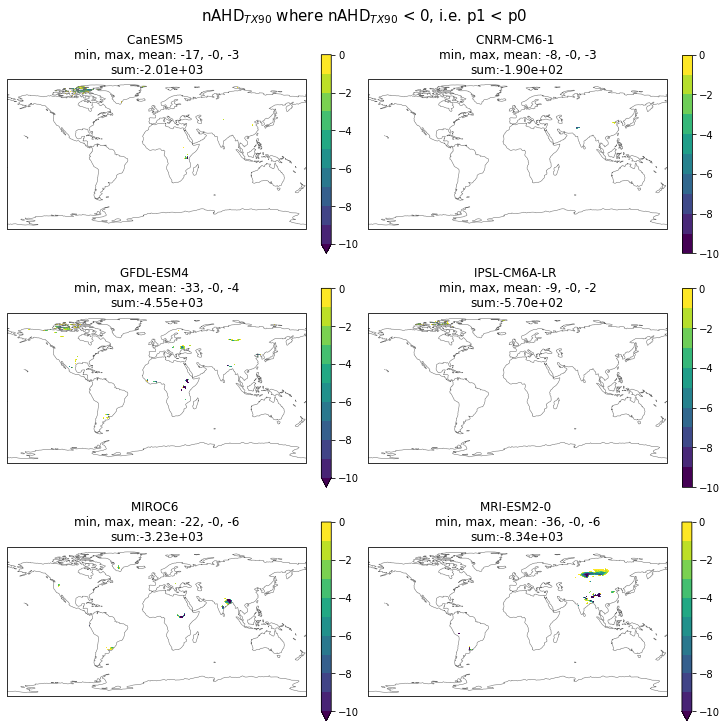

In [15]:
proj = ccrs.PlateCarree() #ccrs.Robinson()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 4 #100

fig, axes = plt.subplots(3, 2, figsize=(10,10), layout='constrained', subplot_kw={'projection': proj})

for GCM, ax in zip(GCMs, axes.flat):
    data_plot = da_nAHD_TX90.sel(model=GCM)*landmask 
    data_plot = data_plot.where(data_plot<0)
    data_plot.plot(ax=ax,vmax=1,vmin=-11,levels=np.arange(-10,1,1), cmap='viridis')
    ax.set_title(f'{GCM} \nmin, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f}'
    f'\nsum:{data_plot.sum():.2e}')
    ax.coastlines(color='dimgray', linewidth=0.5)


fig.suptitle('nAHD$_{TX90}$ where nAHD$_{TX90}$ < 0, i.e. p1 < p0', size=15);

/apps/brussel/RL8/skylake/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/coding/times.py:682: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/apps/brussel/RL8/skylake/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(array[self.key], dtype=None)


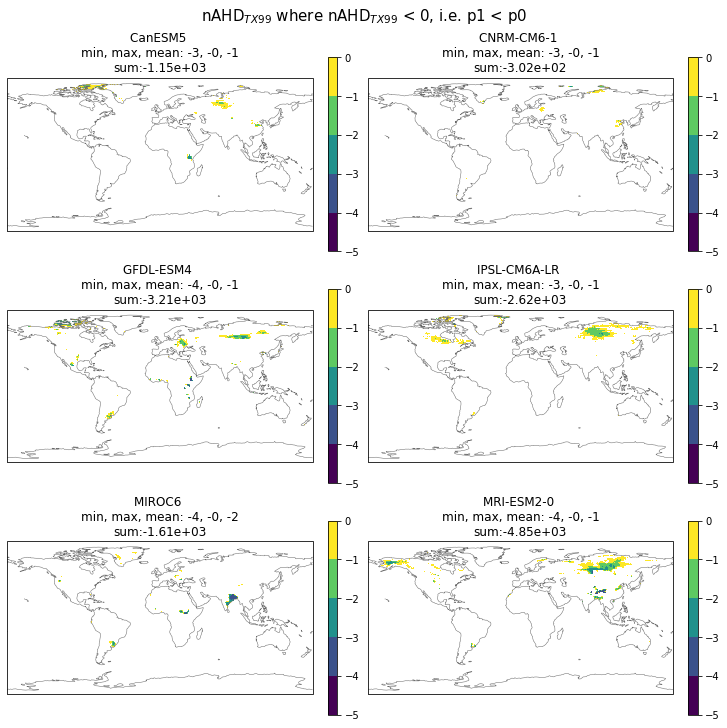

In [14]:
proj = ccrs.PlateCarree() #ccrs.Robinson()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 4 #100

fig, axes = plt.subplots(3, 2, figsize=(10,10), layout='constrained', subplot_kw={'projection': proj})

for GCM, ax in zip(GCMs, axes.flat):
    data_plot = da_nAHD_TX99.sel(model=GCM)*landmask 
    data_plot = data_plot.where(data_plot<0)
    data_plot.plot(ax=ax,levels=np.arange(-5,1,1), cmap='viridis')
    ax.set_title(f'{GCM} \nmin, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f}'
    f'\nsum:{data_plot.sum():.2e}')
    ax.coastlines(color='dimgray', linewidth=0.5)


fig.suptitle('nAHD$_{TX99}$ where nAHD$_{TX99}$ < 0, i.e. p1 < p0', size=15);

/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/coding/times.py:682: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(array[self.key], dtype=None)


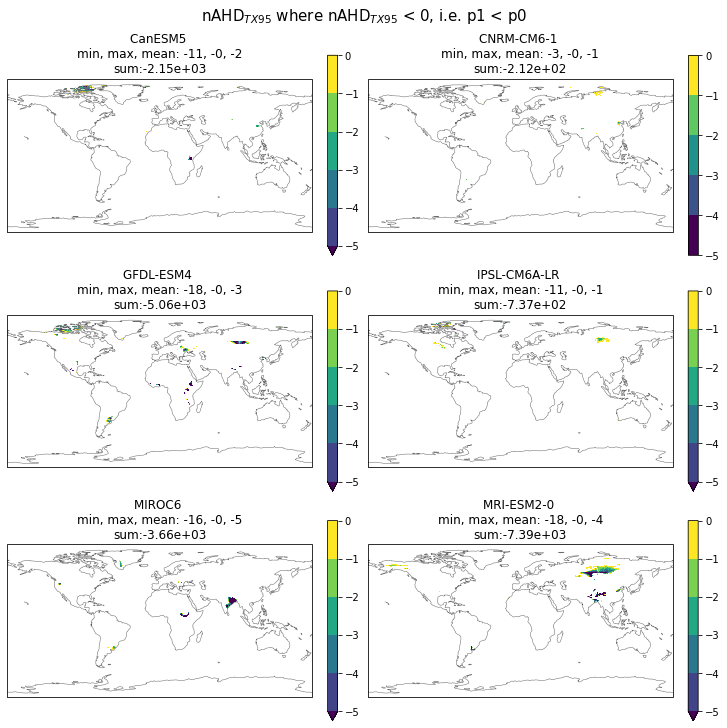

In [29]:
proj = ccrs.PlateCarree() #ccrs.Robinson()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 4 #100

fig, axes = plt.subplots(3, 2, figsize=(10,10), layout='constrained', subplot_kw={'projection': proj})

for GCM, ax in zip(GCMs, axes.flat):
    data_plot = da_nAHD_TX95.sel(model=GCM)*landmask 
    data_plot = data_plot.where(data_plot<0)
    data_plot.plot(ax=ax,levels=np.arange(-5,1,1), cmap='viridis')
    ax.set_title(f'{GCM} \nmin, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f}'
    f'\nsum:{data_plot.sum():.2e}')
    ax.coastlines(color='dimgray', linewidth=0.5)


fig.suptitle('nAHD$_{TX95}$ where nAHD$_{TX95}$ < 0, i.e. p1 < p0', size=15);

Description: Mostly these values (nAHD90, nAHD95 nAHD99) are positive everywhere, indicating an increase in the likelihood of hot days. In the places where they are negative, i.e. indicating a decrease in hot days, the magnitudes are small (e.g. max -4 for TX99) and occur only in certain models/locations.

*potentially understand a bit better why in those models/locations - is it generally a representation of cooling in these places e.g. due to irrigation or is it just the tails becoming less heavy? e.g. also irrigation or other mechanisms??*

#### ii. model spread and (dis)agreement for TX99

Larger spread in areas with larger values.
Expand on this in another notebook, with model evaluation and comparison with observations and hist-nat. 



/apps/brussel/RL8/skylake/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/coding/times.py:682: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/apps/brussel/RL8/skylake/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(array[self.key], dtype=None)


Text(0.5, 1.0, 'multi-model max in nAHD (TX99) \nmin, max, mean: 1, 247, 25')

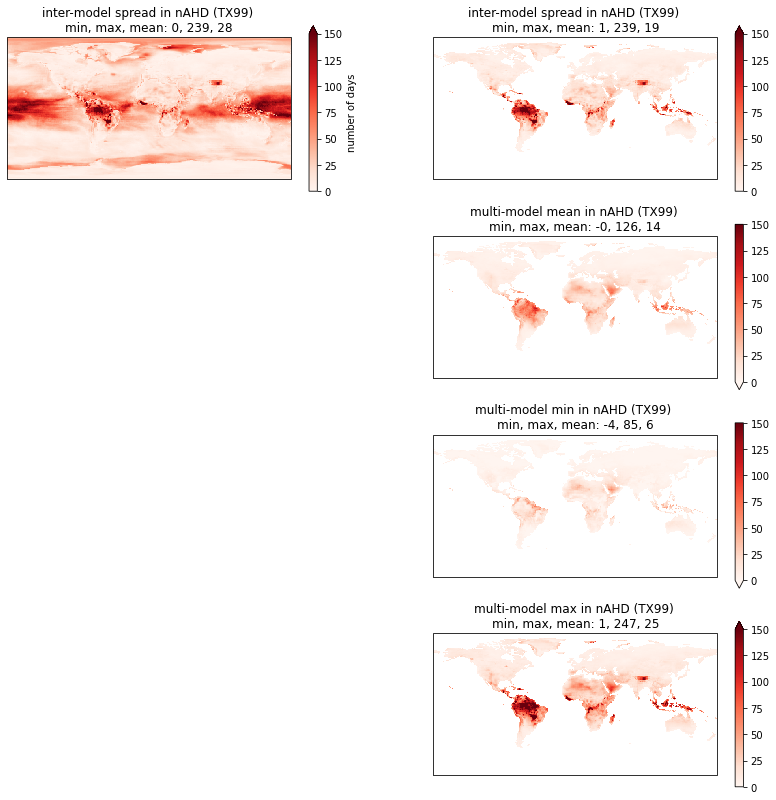

In [ ]:
fig = plt.figure(figsize=(14,14))
proj = ccrs.Robinson()
landmask = get_mask()
vmin = 0
vmax = 150

axes = [plt.subplot(421, projection=proj), plt.subplot(422, projection=proj), 
       plt.subplot(424, projection=proj), plt.subplot(426, projection=proj),
       plt.subplot(428, projection=proj)]

ax=axes[0]
data_plot =(da_nAHD_TX99.max(dim='model') - da_nAHD_TX99.min(dim='model'))
data_plot.plot(ax=ax,cmap='Reds', vmin=vmin, vmax=vmax)
ax.set_title(f'inter-model spread in nAHD (TX99) \nmin, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f}')

ax=axes[1]
data_plot =(da_nAHD_TX99.max(dim='model') - da_nAHD_TX99.min(dim='model')) *landmask 
data_plot.plot(ax=ax,cmap='Reds', vmin=vmin, vmax=vmax)
ax.set_title(f'inter-model spread in nAHD (TX99) \nmin, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f}')

ax=axes[2]
data_plot =da_nAHD_TX99.mean(dim='model') *landmask 
data_plot.plot(ax=ax,cmap='Reds', vmin=vmin, vmax=vmax)
ax.set_title(f'multi-model mean in nAHD (TX99) \nmin, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f}')

ax=axes[3]
data_plot =da_nAHD_TX99.min(dim='model') *landmask 
data_plot.plot(ax=ax,cmap='Reds', vmin=vmin, vmax=vmax)
ax.set_title(f'multi-model min in nAHD (TX99) \nmin, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f}')

ax=axes[4]
data_plot =da_nAHD_TX99.max(dim='model') *landmask 
data_plot.plot(ax=ax,cmap='Reds', vmin=vmin, vmax=vmax)
ax.set_title(f'multi-model max in nAHD (TX99) \nmin, max, mean: {data_plot.min():.0f}, {data_plot.max():.0f}, {data_plot.mean():.0f}')


### 1b. compare demographic results

Look at, for different thresholds & different models 
- n of people living through at least x days
- proportion of age group living through at least x days
- average per capita nAHD per age group - TO DO? 

#### o. preprocess population data

Memo:
- do some exploration of demographics/spatial patterns of age groups in different countries (how many people in different countries, how many children - maybe normalized by surface area also !) - see attr-hw-population-signal 
- fix demographic data bug at coast and check absolute n of people ISIMIP2 vs. ISIMIP3 

In [59]:
sys.path.append('../population/') # make this a module i can pip install and import ! 
from population_demographics_climate import * # move / rename this when good ! 


In [60]:
d_countries = preprocess_all_country_population_data()
gs_population_global = get_gridscale_population_global( 
    d_countries,
    startyear=2022,
    endyear=None,
    save=False # change where this gets saved !!!! now its in package folder
)

interpolating cohort sizes per country
after interpolation and mean-preserving correction there are some neg numbers in 10, Azerbaijan, setting them to zero
after interpolation and mean-preserving correction there are some neg numbers in 98, Libya, setting them to zero
after interpolation and mean-preserving correction there are some neg numbers in 136, Papua New Guinea, setting them to zero
Aruba small, population not calculated
Antigua and Barbuda small, population not calculated
Bahrain small, population not calculated
Barbados small, population not calculated
Federated States of Micronesia small, population not calculated
Grenada small, population not calculated
Guam small, population not calculated
Saint Lucia small, population not calculated
Macao small, population not calculated
Maldives small, population not calculated
Malta small, population not calculated
Singapore small, population not calculated
Tonga small, population not calculated
calculating gridscale population per cou

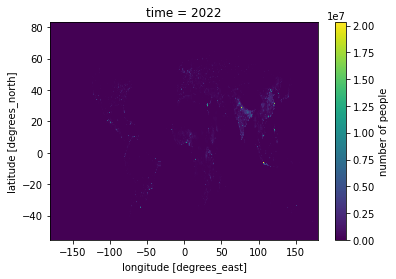

In [61]:
gs_population_global.sum(dim='ages').plot()
# highest latitudes where there is no population are cut !

#### i. compare barplots: number of people and proportion of age group experiencing x nAHD at each of the different thresholds

Aggregate data to age groups: number of people of 10 year age brackets living through at least x AHD and proportion of cohort of 10 year age bracket living through at least x AHD. 

Memo:
- have code to do this for children versus 'adults' with different definitions in other script - potentially do this to have a "children" bar aggregated to the left of the other ages...(or rolling 18 year brackets)

In [179]:

da_n_people_TX90, da_prop_people_TX90 = calc_number_proportion_people_atleastxdays_10yr(gs_population_global, GCMs, da_nAHD_TX90,  x_hot_days = [1,5,10,20,50])
da_n_people_TX95, da_prop_people_TX95 = calc_number_proportion_people_atleastxdays_10yr(gs_population_global, GCMs, da_nAHD_TX95,  x_hot_days = [1,5,10,20,50])
da_n_people_TX99, da_prop_people_TX99 = calc_number_proportion_people_atleastxdays_10yr(gs_population_global, GCMs, da_nAHD_TX99,  x_hot_days = [1,5,10,20,50])

da_n_people_TX90_hi, da_prop_people_TX90_hi = calc_number_proportion_people_atleastxdays_10yr(gs_population_global, GCMs, da_nAHD_TX90,  x_hot_days = [50,80,100,150])
da_n_people_TX95_hi, da_prop_people_TX95_hi = calc_number_proportion_people_atleastxdays_10yr(gs_population_global, GCMs, da_nAHD_TX95,  x_hot_days = [50,80,100,150])
da_n_people_TX99_hi, da_prop_people_TX99_hi = calc_number_proportion_people_atleastxdays_10yr(gs_population_global, GCMs, da_nAHD_TX99,  x_hot_days = [50,80,100,150])

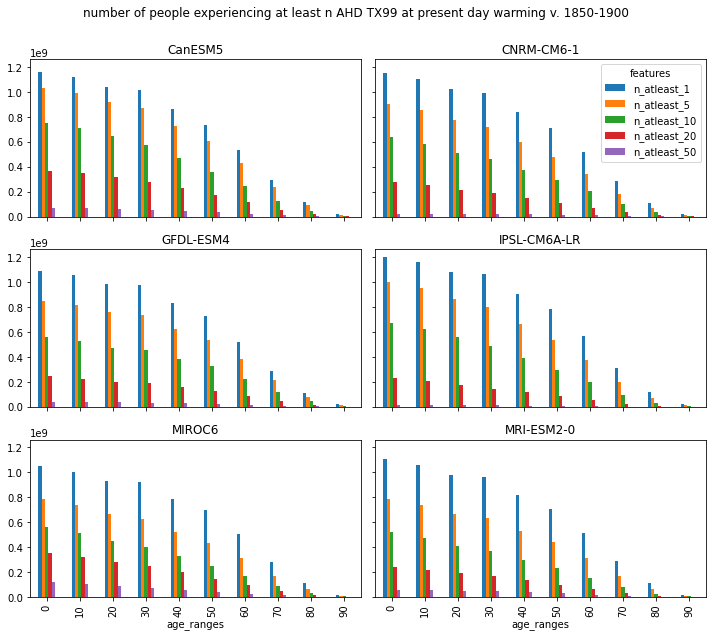

In [38]:
# number of people, TX90

fig, axes = plt.subplots(3,2,figsize=(10,9),sharex=True, sharey=True)
axes = axes.flatten()

for i, (GCM, ax) in enumerate(zip(GCMs, axes)):
    
    # make legend only appear on one subplot
    leg = True if i == 1 else False
    
    # plot 
    data_plot = da_n_people_TX99.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=leg)
    ax.set_title(f'{da_n_people_TX99.model[i].values}')

    
fig.suptitle('number of people experiencing at least n AHD TX99 at present day warming v. 1850-1900\n', size=12)
fig.tight_layout()

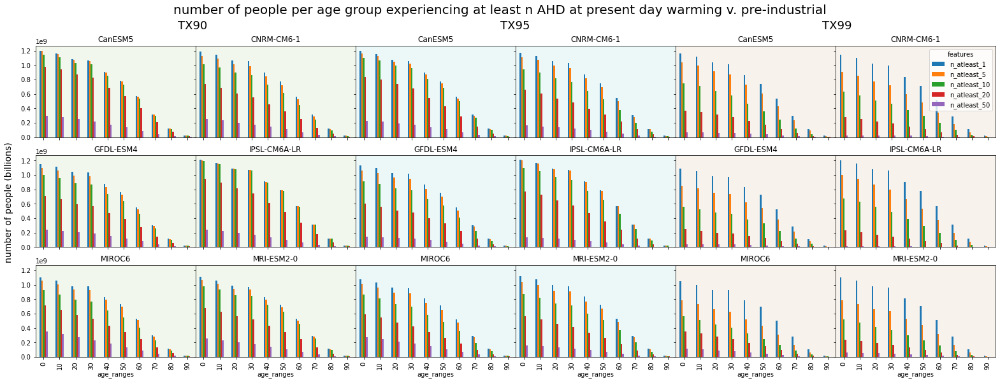

In [131]:
fig, axes = plt.subplots(3,2*3,figsize=(9*3,9),sharex=True, sharey=True)
axes = axes.flatten()


pos=np.array([0, 1, 6, 7, 12, 13])
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    # make legend only appear on one subplot
    leg = False
    # plot 
    data_plot = da_n_people_TX90.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=leg)
    ax.set_title(f'{da_n_people_TX90.model[i].values}')
    ax.set_facecolor('#f1f7ec')
    
pos=np.array([0, 1, 6, 7, 12, 13])+2
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    # make legend only appear on one subplot
    leg = False
    # plot 
    data_plot = da_n_people_TX95.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=leg)
    ax.set_title(f'{da_n_people_TX95.model[i].values}')
    ax.set_facecolor('#Ecf7f7')
    
pos=np.array([0, 1, 6, 7, 12, 13])+4
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    # make legend only appear on one subplot
    leg = True if i == 1 else False
    # plot 
    data_plot = da_n_people_TX99.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=leg)
    ax.set_title(f'{da_n_people_TX99.model[i].values}')
    ax.set_facecolor('#f7f3ec')
    
fig.suptitle('number of people per age group experiencing at least n AHD at present day warming v. pre-industrial\n \n', size=20)
fig.supylabel('number of people (billions)', x=0.1,size=14);

fig.text(0.24,0.92,'TX90',size=18);
fig.text(0.5,0.92,'TX95',size=18);
fig.text(0.76,0.92,'TX99',size=18);
fig.subplots_adjust(wspace=0, hspace=None)


#fig.supxlabel('age ranges',size=14);
#fig.tight_layout()

##### results: number of people

Looking at number of people of each age group exposed to a certain number of additional TX90, TX95 TX99 the demographic pattern is clear, both for low thresholds and for high thresholds, younger people are more exposed than older people.
Pattern holds for all percentile thresholds and for all threshold number. 

To do
- make conceptual CDF sketch representing change in TX90,95,99

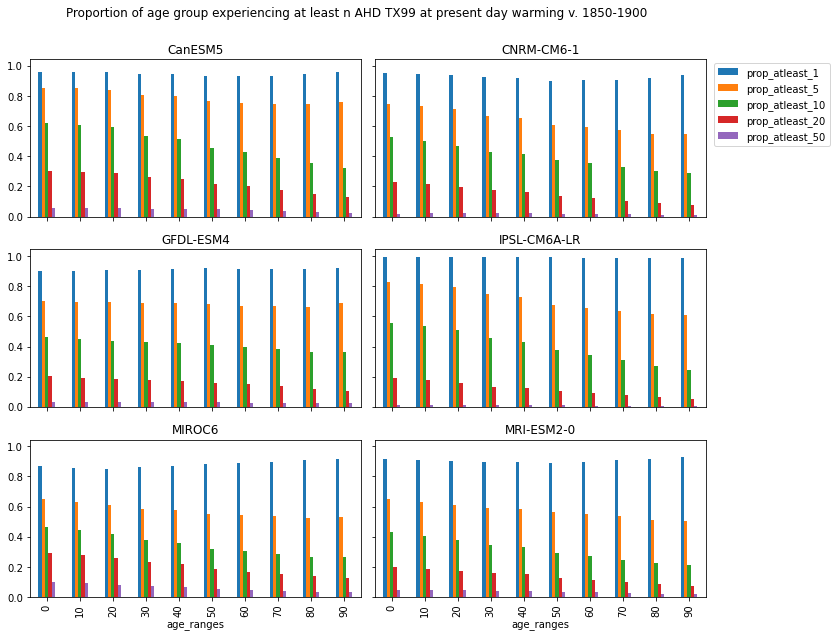

In [134]:
fig, axes = plt.subplots(3, 2, figsize=(10, 9), sharex=True, sharey=True)
axes = axes.flatten()

# Create an empty list to store handles for legends
legend_handles = []

for i, (GCM, ax) in enumerate(zip(GCMs, axes)):
    
    # plot 
    data_plot = da_prop_people_TX99.sel(model=GCM)
    handles, labels = data_plot.to_pandas().plot.bar(ax=ax, legend=False).get_legend_handles_labels()
    legend_handles.extend(handles)
    
    ax.set_title(f'{da_prop_people_TX99.model[i].values}')

# Create a common legend outside the subplots
fig.legend(legend_handles, labels, loc='upper left', bbox_to_anchor=(.99, .9), ncol=1)

fig.suptitle('Proportion of age group experiencing at least n AHD TX99 at present day warming v. 1850-1900\n', size=12)
fig.tight_layout(rect=[0, 0, 1, 1])  # rect=[0, 0.03, 1, 0.95] Adjust the rect parameter to make room for the suptitle and common legend



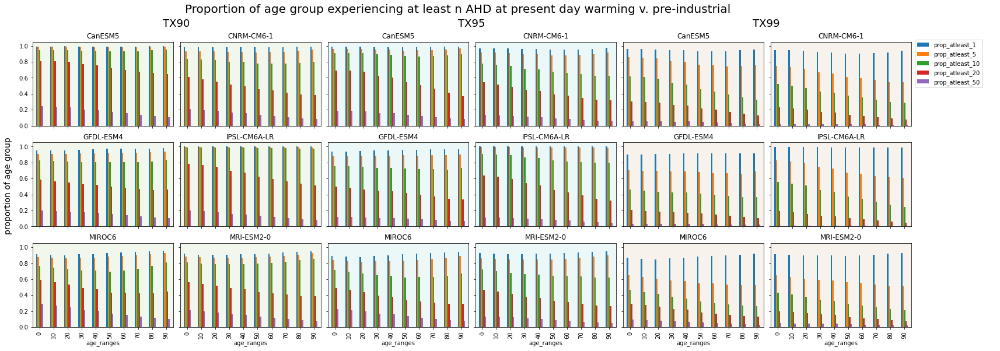

In [162]:
fig, axes = plt.subplots(3,2*3,figsize=(9*3,9),sharex=True, sharey=True)
axes = axes.flatten()

# Create an empty list to store handles for legends
legend_handles = []


pos=np.array([0, 1, 6, 7, 12, 13])
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    # plot 
    data_plot = da_prop_people_TX90.sel(model=GCM)
    handles, labels = data_plot.to_pandas().plot.bar(ax=ax, legend=False).get_legend_handles_labels()
    legend_handles.extend(handles)
    ax.set_title(f'{da_prop_people_TX90.model[i].values}')
    ax.set_facecolor('#f1f7ec')
    
pos=np.array([0, 1, 6, 7, 12, 13])+2
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    data_plot = da_prop_people_TX95.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=False)
    ax.set_title(f'{da_prop_people_TX95.model[i].values}')
    ax.set_facecolor('#Ecf7f7')
    
pos=np.array([0, 1, 6, 7, 12, 13])+4
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    data_plot = da_prop_people_TX99.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=False)
    ax.set_title(f'{da_prop_people_TX99.model[i].values}')
    ax.set_facecolor('#f7f3ec')
    
fig.suptitle('Proportion of age group experiencing at least n AHD at present day warming v. pre-industrial\n \n', size=20)
fig.supylabel('proportion of age group', x=0.1,size=14);

fig.text(0.24,0.92,'TX90',size=18);
fig.text(0.5,0.92,'TX95',size=18);
fig.text(0.76,0.92,'TX99',size=18);
fig.subplots_adjust(wspace=0.05, hspace=None)

# Create a common legend outside the subplots
fig.legend(legend_handles, labels, loc=(.915,.75), ncol=1)



##### results: proportion of age groups

In terms of the proportion of age group, this holds for some values. In general holds for higher thresholds of nAHD. 

For TX90 this holds for all models for n=20 days and n=50 days (check this! note: these are not very high values for TX90, check for more extreme values). 

For TX99 this holds for some model/values combinations at lower thresholds and most/all models at higher thresholds. Holds for 4-5 out of 6 models for n=5 (exception GFDL) for 5 out of 6 models for n=10 (exception GFDL), for all models for n=20 and n=50 (check this from values, print summary tables and some summary stats/multiplication factors).

For TX95 holds for most models for n=20 and n=50. 

Memo:
- check higher values of n especially for TX90
- pirnt out summary tables/summary stats that can be useful - how to summarize these results 

In [168]:
i=3
data = da_prop_people_TX90.isel(features=i).to_pandas() #.sel(model='CanESM5')
print(da_prop_people_TX90.features.values[i])
data

prop_atleast_20


age_ranges,0,10,20,30,40,50,60,70,80,90
model,,,,,,,,,,
CanESM5,0.805128,0.804586,0.800491,0.76799,0.754055,0.718326,0.699582,0.675155,0.658921,0.644543
CNRM-CM6-1,0.610607,0.583452,0.555731,0.515178,0.497176,0.457278,0.441878,0.417147,0.391035,0.388194
GFDL-ESM4,0.583922,0.566417,0.549205,0.527435,0.518165,0.499547,0.48409,0.468724,0.452638,0.459436
IPSL-CM6A-LR,0.784544,0.76881,0.748292,0.69682,0.672681,0.621502,0.596599,0.565422,0.5324,0.515947
MIROC6,0.591773,0.561296,0.531154,0.490668,0.475374,0.434437,0.430493,0.424755,0.425865,0.448071
MRI-ESM2-0,0.564521,0.540666,0.517907,0.486457,0.471831,0.43944,0.427205,0.407491,0.386789,0.386996


In [185]:
i=3
data = da_prop_people_TX99.isel(features=i).to_pandas() #.sel(model='CanESM5')
print(da_prop_people_TX99.features.values[i])

#data # proportion of each age group 
data.div(data.iloc[:,0],axis=0) # proportion of each age group cfr. proportion of 0-10 age group 

prop_atleast_20


age_ranges,0,10,20,30,40,50,60,70,80,90
model,,,,,,,,,,
CanESM5,1.0,0.98264,0.953016,0.854963,0.820834,0.717443,0.658378,0.572799,0.490117,0.416836
CNRM-CM6-1,1.0,0.930739,0.854515,0.758876,0.712862,0.601454,0.53464,0.457118,0.385158,0.329924
GFDL-ESM4,1.0,0.95453,0.906948,0.874648,0.84682,0.79245,0.732301,0.669989,0.579784,0.507854
IPSL-CM6A-LR,1.0,0.913937,0.81607,0.697333,0.655835,0.550934,0.483159,0.406891,0.324588,0.253621
MIROC6,1.0,0.941019,0.875499,0.776683,0.738668,0.628749,0.571014,0.512607,0.465346,0.437955
MRI-ESM2-0,1.0,0.946982,0.883888,0.798066,0.757801,0.638603,0.570601,0.499205,0.431274,0.370976


#### ii. higher values 

Since TX90 is a low threshold, look at how higher thresholds of n behave with TX90


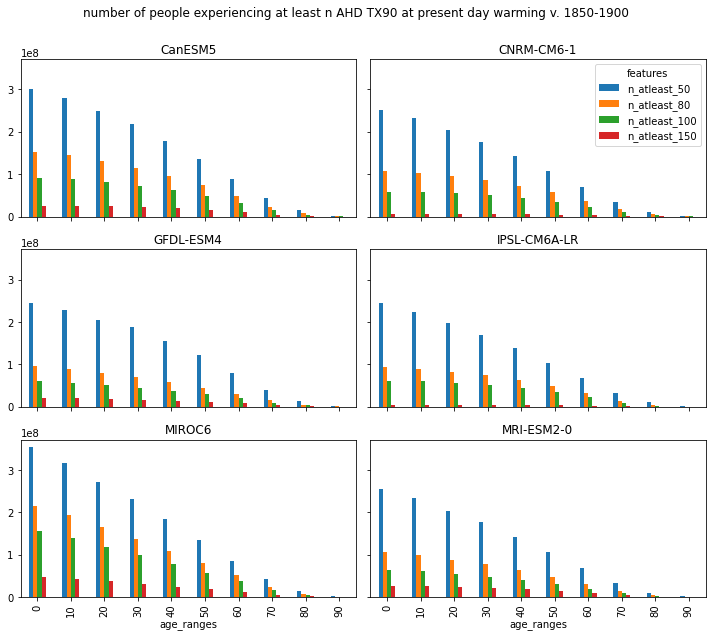

In [170]:
# number of people, TX90

fig, axes = plt.subplots(3,2,figsize=(10,9),sharex=True, sharey=True)
axes = axes.flatten()

for i, (GCM, ax) in enumerate(zip(GCMs, axes)):
    
    # make legend only appear on one subplot
    leg = True if i == 1 else False
    
    # plot 
    data_plot = da_n_people_TX90_hi.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=leg)
    ax.set_title(f'{da_n_people_TX90_hi.model[i].values}')

    
fig.suptitle('number of people experiencing at least n AHD TX90 at present day warming v. 1850-1900\n', size=12)
fig.tight_layout()

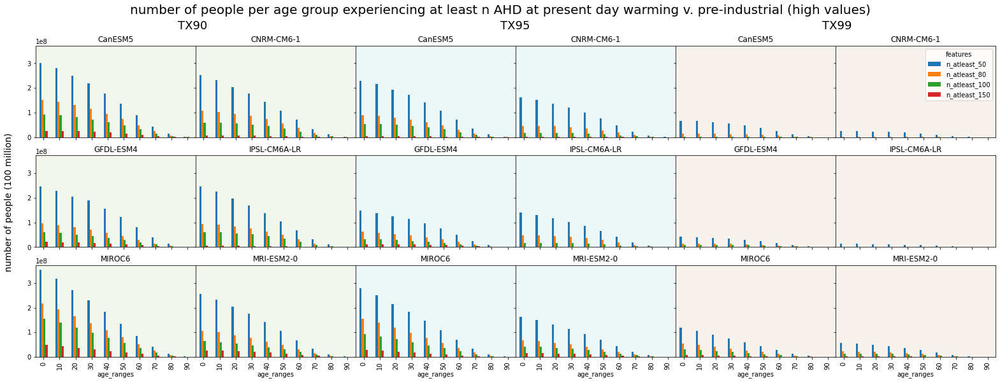

In [184]:
fig, axes = plt.subplots(3,2*3,figsize=(9*3,9),sharex=True, sharey=True)
axes = axes.flatten()


pos=np.array([0, 1, 6, 7, 12, 13])
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    # make legend only appear on one subplot
    leg = False
    # plot 
    data_plot = da_n_people_TX90_hi.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=leg)
    ax.set_title(f'{da_n_people_TX90_hi.model[i].values}')
    ax.set_facecolor('#f1f7ec')
    
pos=np.array([0, 1, 6, 7, 12, 13])+2
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    # make legend only appear on one subplot
    leg = False
    # plot 
    data_plot = da_n_people_TX95_hi.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=leg)
    ax.set_title(f'{da_n_people_TX95_hi.model[i].values}')
    ax.set_facecolor('#Ecf7f7')
    
pos=np.array([0, 1, 6, 7, 12, 13])+4
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    # make legend only appear on one subplot
    leg = True if i == 1 else False
    # plot 
    data_plot = da_n_people_TX99_hi.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=leg)
    ax.set_title(f'{da_n_people_TX99_hi.model[i].values}')
    ax.set_facecolor('#f7f3ec')
    
fig.suptitle('number of people per age group experiencing at least n AHD at present day warming v. pre-industrial (high values)\n \n', size=20)
fig.supylabel('number of people (100 million)', x=0.1,size=14);

fig.text(0.24,0.92,'TX90',size=18);
fig.text(0.5,0.92,'TX95',size=18);
fig.text(0.76,0.92,'TX99',size=18);
fig.subplots_adjust(wspace=0, hspace=None)

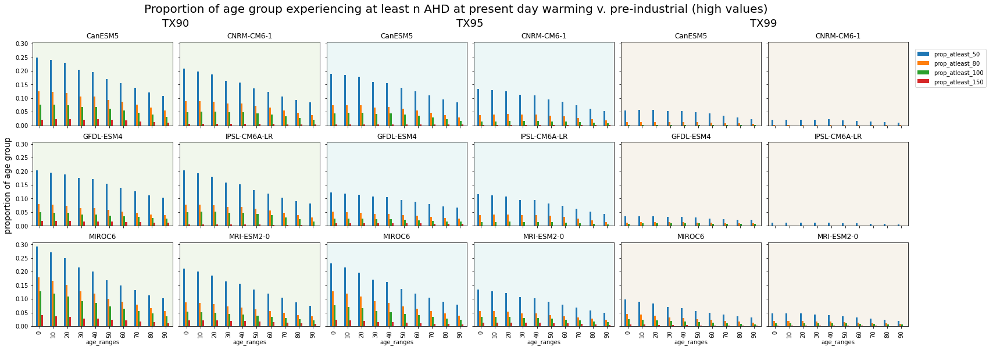

In [183]:
fig, axes = plt.subplots(3,2*3,figsize=(9*3,9),sharex=True, sharey=True)
axes = axes.flatten()

# Create an empty list to store handles for legends
legend_handles = []


pos=np.array([0, 1, 6, 7, 12, 13])
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    # plot 
    data_plot = da_prop_people_TX90_hi.sel(model=GCM)
    handles, labels = data_plot.to_pandas().plot.bar(ax=ax, legend=False).get_legend_handles_labels()
    legend_handles.extend(handles)
    ax.set_title(f'{da_prop_people_TX90_hi.model[i].values}')
    ax.set_facecolor('#f1f7ec')
    
pos=np.array([0, 1, 6, 7, 12, 13])+2
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    data_plot = da_prop_people_TX95_hi.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=False)
    ax.set_title(f'{da_prop_people_TX95_hi.model[i].values}')
    ax.set_facecolor('#Ecf7f7')
    
pos=np.array([0, 1, 6, 7, 12, 13])+4
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    data_plot = da_prop_people_TX99_hi.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=False)
    ax.set_title(f'{da_prop_people_TX99_hi.model[i].values}')
    ax.set_facecolor('#f7f3ec')
    
fig.suptitle('Proportion of age group experiencing at least n AHD at present day warming v. pre-industrial (high values)\n \n', size=20)
fig.supylabel('proportion of age group', x=0.1,size=14);

fig.text(0.24,0.92,'TX90',size=18);
fig.text(0.5,0.92,'TX95',size=18);
fig.text(0.76,0.92,'TX99',size=18);
fig.subplots_adjust(wspace=0.05, hspace=None)

# Create a common legend outside the subplots
fig.legend(legend_handles, labels, loc=(.915,.75), ncol=1)



In [173]:
data = da_prop_people_TX90_hi.sel(model='CanESM5').isel(features=3)
#y = data.values
#x = data.age_ranges
#plt.plot(x,y)
data

<xarray.DataArray 'proportion' (age_ranges: 10)>
array([0.021492645276912584, 0.022391575133694788, 0.02264315338434959,
       0.02132341081565852, 0.02196551897606594, 0.02017213096490804,
       0.018125991282687232, 0.015056845373056023, 0.012319656337136862,
       0.009510427431146364], dtype=object)
Coordinates:
  * age_ranges  (age_ranges) int64 0 10 20 30 40 50 60 70 80 90
    features    <U16 'prop_atleast_150'
    model       <U12 'CanESM5'

##### results: higher values

For higher values, it is informative only wrt TX90 and there you see the clear demographic pattern both for number of people and for proportion of age group

## 2. sensitivity of PR to different percentile thresholds

Overall similar results. 

PRs are much larger for TX99 than for TX90 or TX95, the spatial patterns are more or less similar. The reason is that p0 is much smaller for TX99 (p0=0.01) compared to e.g. TX90 (p0=0.1), so the ratio then balloons more quickly. High PR values are not reached in TX90, TX95. This could be an advantage of using nAHD, that PR overemphasizes the shifts for very rare events. 

In terms of demographic patterns, the pattern holds for number of people for all thresholds. 

For the proportion of an age group, it generally holds for higher thresholds of PR. For PR>1 almost all age cohorts are exposed at almost 100%, as expected. At higher values of PR the demographic pattern becomes more noticeable. 
For TX90 it holds for PR>2. For TX95 it holds for PR>2. For TX99 it holds for PR>4. 

To do:
- Do a bit more sub-global digging and understand results a little bit better. 

### 2a. compare spatial patterns/maps

PRs are much larger for TX99 than for TX90 or TX95, the spatial patterns are more or less similar. The reason is that p0 is much smaller for TX99 (p0=0.01) compared to e.g. TX90 (p0=0.1), so the ratio then balloons more quickly. 

/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/coding/times.py:682: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(array[self.key], dtype=None)
/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/coding/times.py:682: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_date

Text(0.5, 0.98, 'PR present day v. pre-industrial (TX99)')

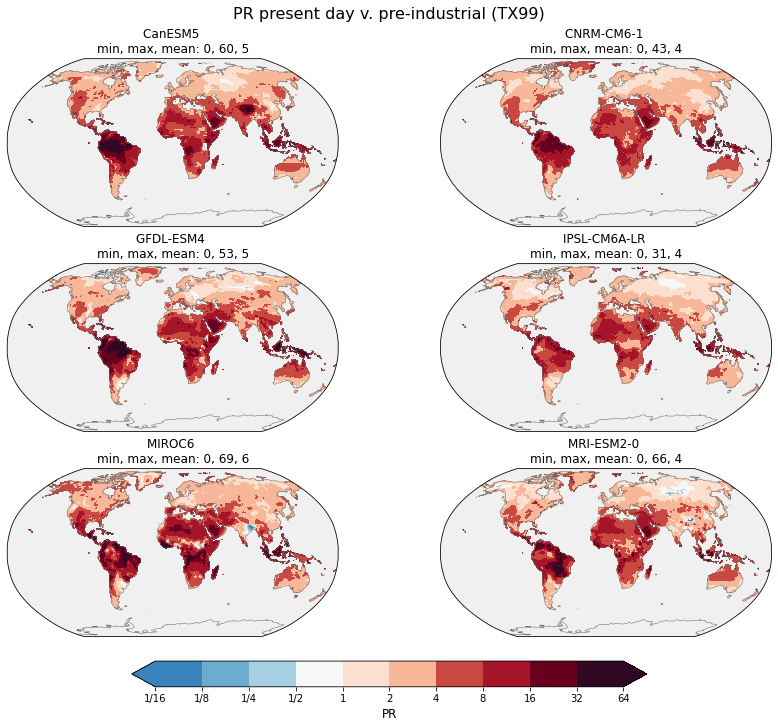

In [216]:
#inputs to functions
bounds, cmap = calc_bounds_cmap_PR_power(7, 'RdBu_r', skew=2)
smooth = 0.3
proj = ccrs.Robinson()

# make figure object
fig, axes = plt.subplots(3,2,figsize=(12,10), subplot_kw={'projection': proj},  layout='constrained')
axes = axes.flatten() 

for GCM, ax in zip(GCMs, axes):
    data_plot = da_PR_TX99.sel(model=GCM)
    plot = plot_PR(data_plot, ax, cmap, bounds, title='summary_stats', smooth=0.3, mask=True)


cbar_lab = 'PR' # try to get TeX interpreter 'less likely $\leftarrow$ PR $\rightarrow$ more likely' #'PR' # add more/less likely arrow 
cbar = fig.colorbar(plot, ticks=bounds, extend='both', ax=axes, shrink=0.6, location='bottom', fraction= 0.045, pad= 0.04) #location='bottom' 
labels = ['1/{}'.format(int(1/t)) if t<1 else str(t) for t in bounds]
cbar.ax.set_xticklabels(labels)
cbar.set_label(label=cbar_lab, size=12) 

fig.suptitle('PR present day v. pre-industrial (TX99)', size=16);

/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/coding/times.py:682: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(array[self.key], dtype=None)
/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/coding/times.py:682: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_date

Text(0.5, 0.98, 'PR present day v. pre-industrial (TX95)')

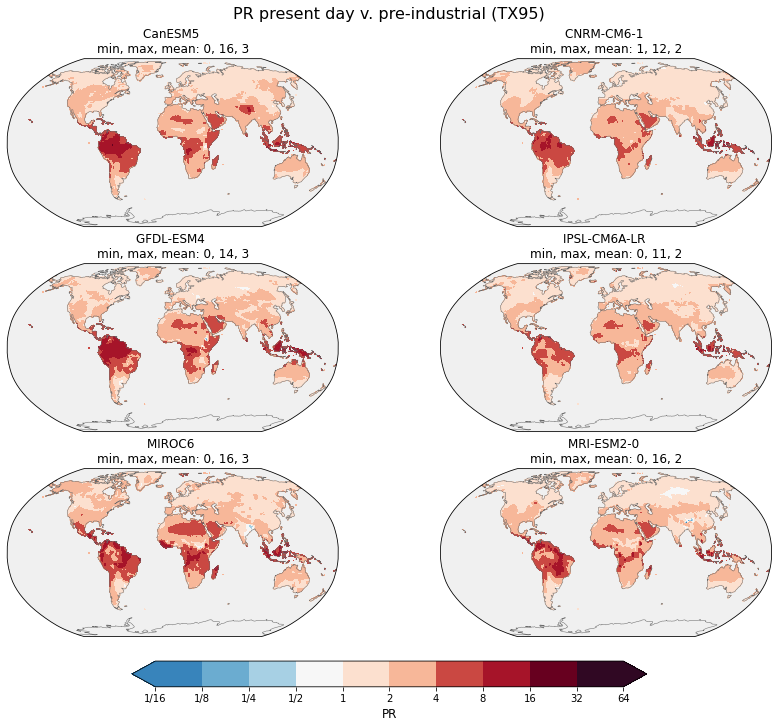

In [217]:
#inputs to functions
bounds, cmap = calc_bounds_cmap_PR_power(7, 'RdBu_r', skew=2)
smooth = 0.3
proj = ccrs.Robinson()

# make figure object
fig, axes = plt.subplots(3,2,figsize=(12,10), subplot_kw={'projection': proj},  layout='constrained')
axes = axes.flatten() 

for GCM, ax in zip(GCMs, axes):
    data_plot = da_PR_TX95.sel(model=GCM)
    plot = plot_PR(data_plot, ax, cmap, bounds, title='summary_stats', smooth=0.3, mask=True)


cbar_lab = 'PR' # try to get TeX interpreter 'less likely $\leftarrow$ PR $\rightarrow$ more likely' #'PR' # add more/less likely arrow 
cbar = fig.colorbar(plot, ticks=bounds, extend='both', ax=axes, shrink=0.6, location='bottom', fraction= 0.045, pad= 0.04) #location='bottom' 
labels = ['1/{}'.format(int(1/t)) if t<1 else str(t) for t in bounds]
cbar.ax.set_xticklabels(labels)
cbar.set_label(label=cbar_lab, size=12) 


fig.suptitle('PR present day v. pre-industrial (TX95)', size=16);

/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/coding/times.py:682: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(array[self.key], dtype=None)
/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/coding/times.py:682: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_date

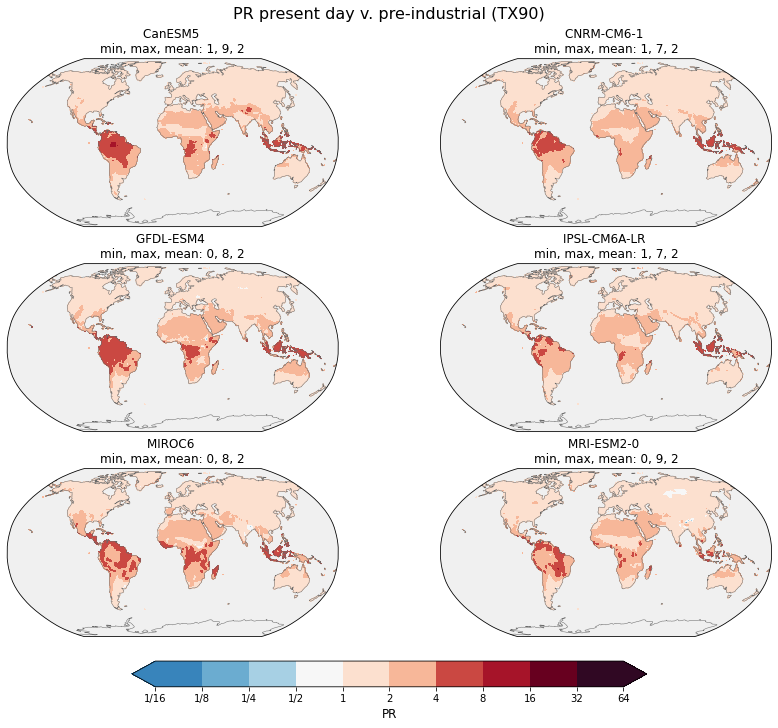

In [218]:
#inputs to functions
bounds, cmap = calc_bounds_cmap_PR_power(7, 'RdBu_r', skew=2)
smooth = 0.3
proj = ccrs.Robinson()

# make figure object
fig, axes = plt.subplots(3,2,figsize=(12,10), subplot_kw={'projection': proj},  layout='constrained')
axes = axes.flatten() 

for GCM, ax in zip(GCMs, axes):
    data_plot = da_PR_TX90.sel(model=GCM)
    plot = plot_PR(data_plot, ax, cmap, bounds, title='summary_stats', smooth=0.3, mask=True)


cbar_lab = 'PR' # try to get TeX interpreter 'less likely $\leftarrow$ PR $\rightarrow$ more likely' #'PR' # add more/less likely arrow 
cbar = fig.colorbar(plot, ticks=bounds, extend='both', ax=axes, shrink=0.6, location='bottom', fraction= 0.045, pad= 0.04) #location='bottom' 
labels = ['1/{}'.format(int(1/t)) if t<1 else str(t) for t in bounds]
cbar.ax.set_xticklabels(labels)
cbar.set_label(label=cbar_lab, size=12) 


fig.suptitle('PR present day v. pre-industrial (TX90)', size=16);

### 2b. compare demographic patterns for crossing PR>1,PR>2....

Pattern holds for number of people for all thresholds. 

For the proportion of an age group, it generally holds for higher thresholds of PR. For PR>1 almost all age cohorts are exposed at almost 100%, as expected. At higher values of PR the demographic pattern becomes more noticeable. 
For TX90 it holds for PR>2. For TX95 it holds for PR>2. For TX99 it holds for PR>4. 

Higher PR values are not reached for lower thresholds (TX90, TX95). 

In [228]:
da_n_people_PR_TX99, da_prop_people_PR_TX99 = calc_number_proportion_people_atleastPR_10yr(gs_population_global, GCMs, da_PR_TX99)
da_n_people_PR_TX95, da_prop_people_PR_TX95 = calc_number_proportion_people_atleastPR_10yr(gs_population_global, GCMs, da_PR_TX95)
da_n_people_PR_TX90, da_prop_people_PR_TX90 = calc_number_proportion_people_atleastPR_10yr(gs_population_global, GCMs, da_PR_TX90)

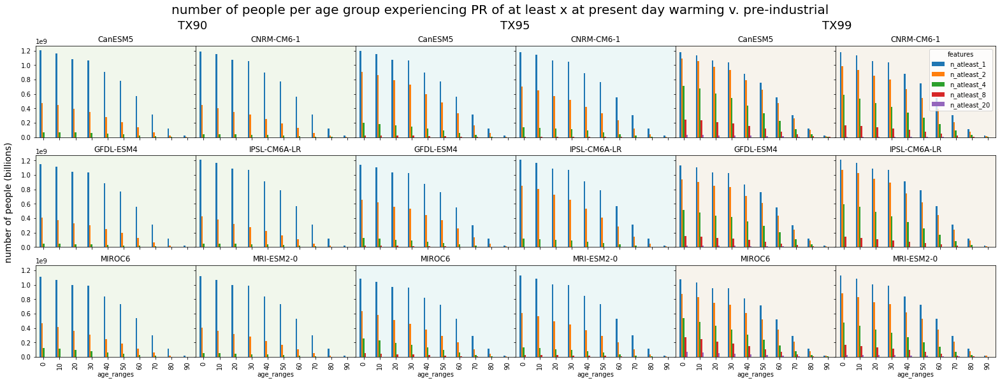

In [229]:
fig, axes = plt.subplots(3,2*3,figsize=(9*3,9),sharex=True, sharey=True)
axes = axes.flatten()


pos=np.array([0, 1, 6, 7, 12, 13])
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    # make legend only appear on one subplot
    leg = False
    # plot 
    data_plot = da_n_people_PR_TX90.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=leg)
    ax.set_title(f'{da_n_people_PR_TX90.model[i].values}')
    ax.set_facecolor('#f1f7ec')
    
pos=np.array([0, 1, 6, 7, 12, 13])+2
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    # make legend only appear on one subplot
    leg = False
    # plot 
    data_plot = da_n_people_PR_TX95.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=leg)
    ax.set_title(f'{da_n_people_PR_TX95.model[i].values}')
    ax.set_facecolor('#Ecf7f7')
    
pos=np.array([0, 1, 6, 7, 12, 13])+4
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    # make legend only appear on one subplot
    leg = True if i == 1 else False
    # plot 
    data_plot = da_n_people_PR_TX99.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=leg)
    ax.set_title(f'{da_n_people_PR_TX99.model[i].values}')
    ax.set_facecolor('#f7f3ec')
    
fig.suptitle('number of people per age group experiencing PR of at least x at present day warming v. pre-industrial\n \n', size=20)
fig.supylabel('number of people (billions)', x=0.1,size=14);

fig.text(0.24,0.92,'TX90',size=18);
fig.text(0.5,0.92,'TX95',size=18);
fig.text(0.76,0.92,'TX99',size=18);
fig.subplots_adjust(wspace=0, hspace=None)


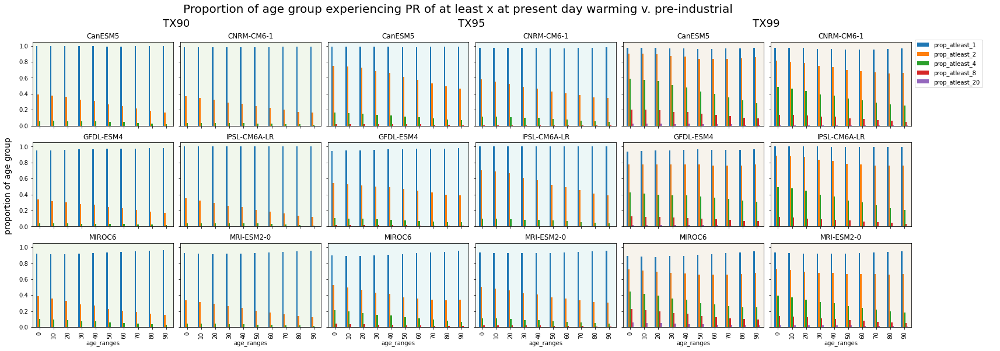

In [231]:
fig, axes = plt.subplots(3,2*3,figsize=(9*3,9),sharex=True, sharey=True)
axes = axes.flatten()

# Create an empty list to store handles for legends
legend_handles = []


pos=np.array([0, 1, 6, 7, 12, 13])
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    # plot 
    data_plot = da_prop_people_PR_TX90.sel(model=GCM)
    handles, labels = data_plot.to_pandas().plot.bar(ax=ax, legend=False).get_legend_handles_labels()
    legend_handles.extend(handles)
    ax.set_title(f'{da_prop_people_PR_TX90.model[i].values}')
    ax.set_facecolor('#f1f7ec')
    
pos=np.array([0, 1, 6, 7, 12, 13])+2
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    data_plot = da_prop_people_PR_TX95.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=False)
    ax.set_title(f'{da_prop_people_PR_TX95.model[i].values}')
    ax.set_facecolor('#Ecf7f7')
    
pos=np.array([0, 1, 6, 7, 12, 13])+4
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    data_plot = da_prop_people_PR_TX99.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=False)
    ax.set_title(f'{da_prop_people_PR_TX99.model[i].values}')
    ax.set_facecolor('#f7f3ec')
    
fig.suptitle('Proportion of age group experiencing PR of at least x at present day warming v. pre-industrial\n \n', size=20)
fig.supylabel('proportion of age group', x=0.1,size=14);

fig.text(0.24,0.92,'TX90',size=18);
fig.text(0.5,0.92,'TX95',size=18);
fig.text(0.76,0.92,'TX99',size=18);
fig.subplots_adjust(wspace=0.05, hspace=None)

# Create a common legend outside the subplots
fig.legend(legend_handles, labels, loc=(.915,.75), ncol=1)

In [235]:
da_prop_people_PR_TX99.sel(model=GCM).isel(features=2)

<xarray.DataArray 'proportion' (age_ranges: 10)>
array([0.3938601378437437, 0.3709388026340276, 0.34512174776039795,
       0.3119649819058131, 0.2982765039522755, 0.26170075138678195,
       0.24110402787410626, 0.21821021081523115, 0.19610077215470353,
       0.1802018705396368], dtype=object)
Coordinates:
  * age_ranges  (age_ranges) int64 0 10 20 30 40 50 60 70 80 90
    features    <U14 'prop_atleast_4'
    model       <U12 'MRI-ESM2-0'

## 3. compare with delta-I: sensitivity to different percentile thresholds and demographic results

To do:
- demographic results sensitivity & summary of findings

### 3a. compare spatial patterns

*Result description* Spatial patterns are complex, generally warming everywhere. Mean warming 1.5-1.8 degrees over land for TX90, TX95, TX99. 

Higher warming localized in Amazon for some models. CanESM also gives a lot of warming in Himalayas (why? melting glaciers??) 

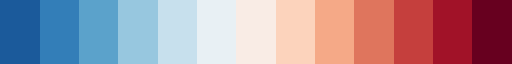

In [45]:
cmap = make_mycmap(cmap='RdBu_r', length=13, skew=1)
color_list = [colors.rgb2hex(cmap(i)) for i in range(cmap.N)]
mycmap = colors.LinearSegmentedColormap.from_list('mycmap', color_list[:-1], len(color_list)-1) # unskew it, get rid of white
mycmap

/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/coding/times.py:682: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(array[self.key], dtype=None)


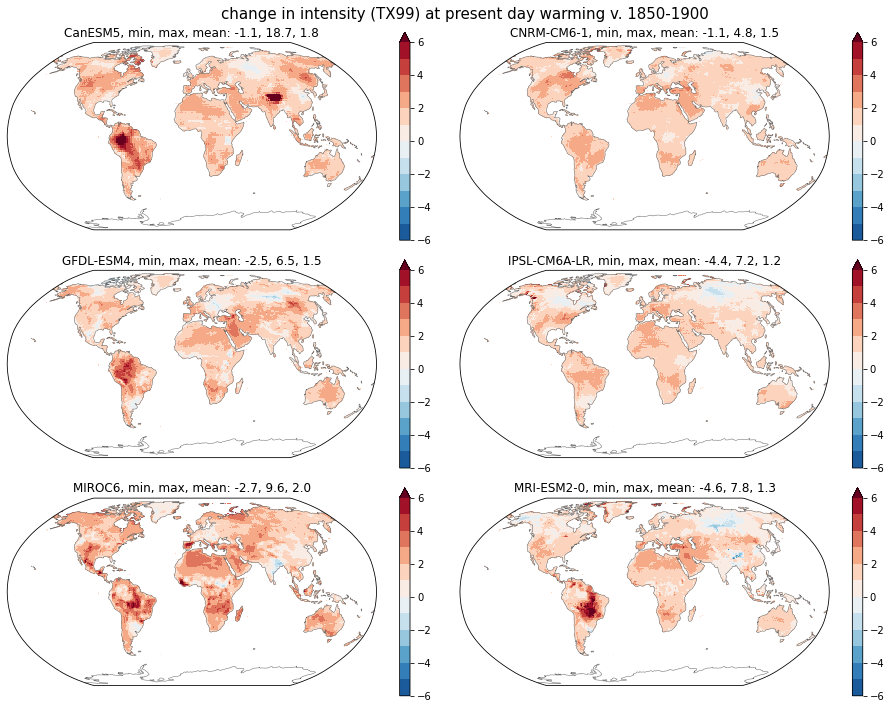

In [49]:
proj = ccrs.Robinson()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 6
levels = np.linspace(-vmax,vmax,num=(vmax*2+1))
cmap = mycmap #'RdBu_r' # mycmap = got rid of white but not enough colors

fig, axes = plt.subplots(3,2,figsize=(13,10), subplot_kw={'projection': proj})
axes = axes.flatten()

for GCM, ax in zip(GCMs, axes):
    data_plot = da_deltaI_TX99.sel(model=GCM)*landmask
    data_plot.plot(ax=ax, cmap = cmap, vmax=vmax, transform=crs, levels=levels, extend='max'); #cmap = 'RdBu_r', vmax=250, vmin=-250, transform=crs
    ax.set_title(f'{GCM}, min, max, mean: {data_plot.min():.1f}, {data_plot.max():.1f}, {data_plot.mean():.1f}');
    ax.coastlines(color='dimgray', linewidth=0.5)
    #ax.add_feature(cfeature.BORDERS, facecolor="none", edgecolor='dimgray', linewidth=0.5 )
    
fig.suptitle('change in intensity (TX99) at present day warming v. 1850-1900', size=15);
fig.tight_layout()

/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/coding/times.py:682: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(array[self.key], dtype=None)


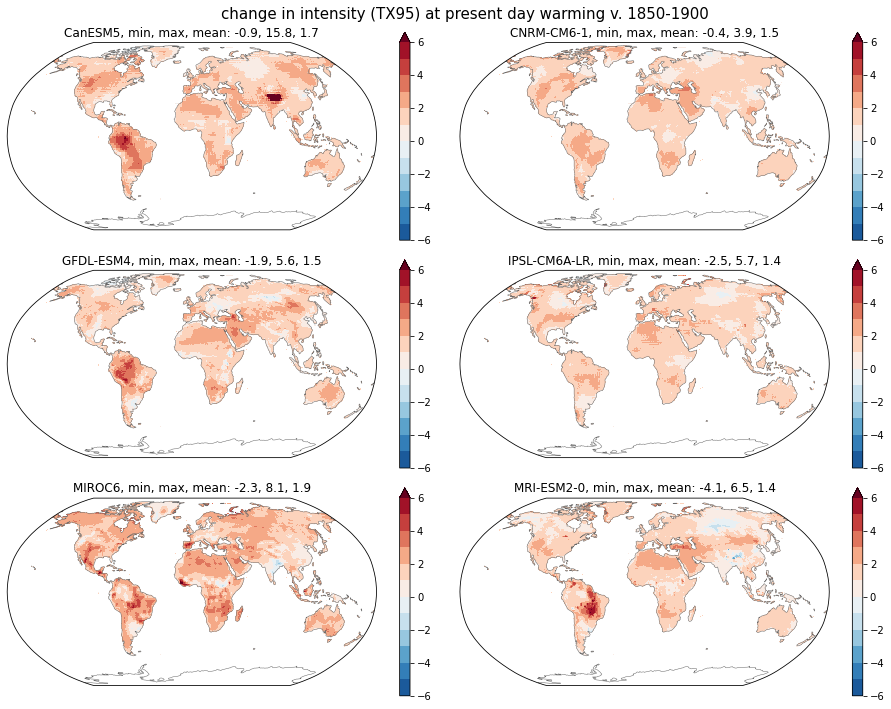

In [50]:
proj = ccrs.Robinson()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 6
levels = np.linspace(-vmax,vmax,num=(vmax*2+1))
cmap = mycmap #'RdBu_r' # mycmap = got rid of white but not enough colors

fig, axes = plt.subplots(3,2,figsize=(13,10), subplot_kw={'projection': proj})
axes = axes.flatten()

for GCM, ax in zip(GCMs, axes):
    data_plot = da_deltaI_TX95.sel(model=GCM)*landmask
    data_plot.plot(ax=ax, cmap = cmap, vmax=vmax, transform=crs, levels=levels, extend='max'); #cmap = 'RdBu_r', vmax=250, vmin=-250, transform=crs
    ax.set_title(f'{GCM}, min, max, mean: {data_plot.min():.1f}, {data_plot.max():.1f}, {data_plot.mean():.1f}');
    ax.coastlines(color='dimgray', linewidth=0.5)
    #ax.add_feature(cfeature.BORDERS, facecolor="none", edgecolor='dimgray', linewidth=0.5 )
    
fig.suptitle('change in intensity (TX95) at present day warming v. 1850-1900', size=15);
fig.tight_layout()


/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/coding/times.py:682: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(array[self.key], dtype=None)


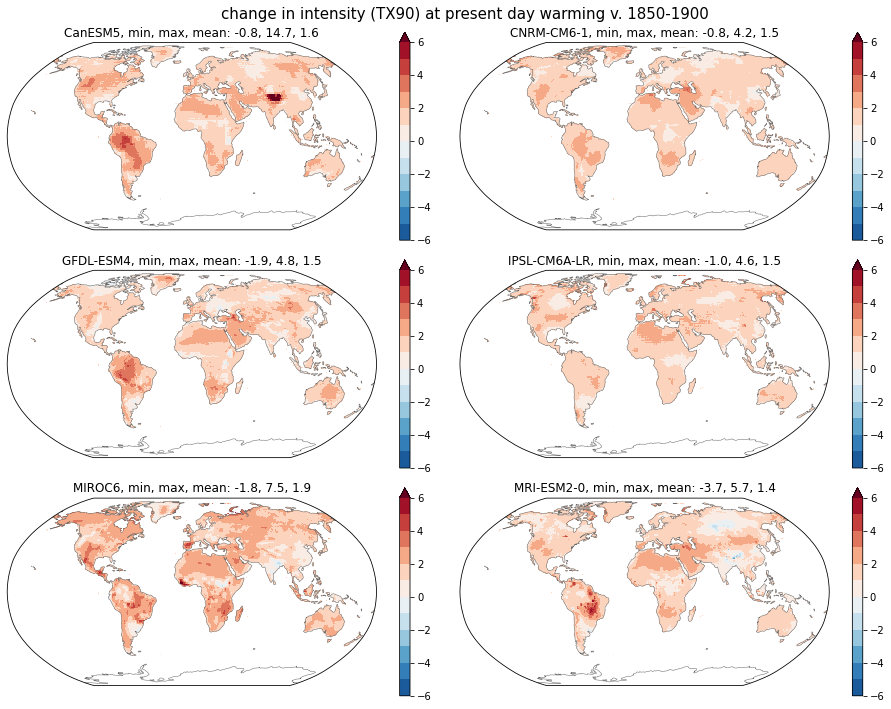

In [51]:
proj = ccrs.Robinson()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 6
levels = np.linspace(-vmax,vmax,num=(vmax*2+1))
cmap = mycmap #'RdBu_r' # mycmap = got rid of white but not enough colors

fig, axes = plt.subplots(3,2,figsize=(13,10), subplot_kw={'projection': proj})
axes = axes.flatten()

for GCM, ax in zip(GCMs, axes):
    data_plot = da_deltaI_TX90.sel(model=GCM)*landmask
    data_plot.plot(ax=ax, cmap = cmap, vmax=vmax, transform=crs, levels=levels, extend='max'); #cmap = 'RdBu_r', vmax=250, vmin=-250, transform=crs
    ax.set_title(f'{GCM}, min, max, mean: {data_plot.min():.1f}, {data_plot.max():.1f}, {data_plot.mean():.1f}');
    ax.coastlines(color='dimgray', linewidth=0.5)
    #ax.add_feature(cfeature.BORDERS, facecolor="none", edgecolor='dimgray', linewidth=0.5 )
    
fig.suptitle('change in intensity (TX90) at present day warming v. 1850-1900', size=15);
fig.tight_layout()


#### difference maps

*Description* Not everywhere true that TX99 warms more than TX90 or TX95. It is true in places with strongest warming simulated (e.g. Amazon in some models). No clear spatial pattern immediately visible regarding whether delta-I TX99 is warmer than delta-I TX95. 

/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/coding/times.py:682: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(array[self.key], dtype=None)


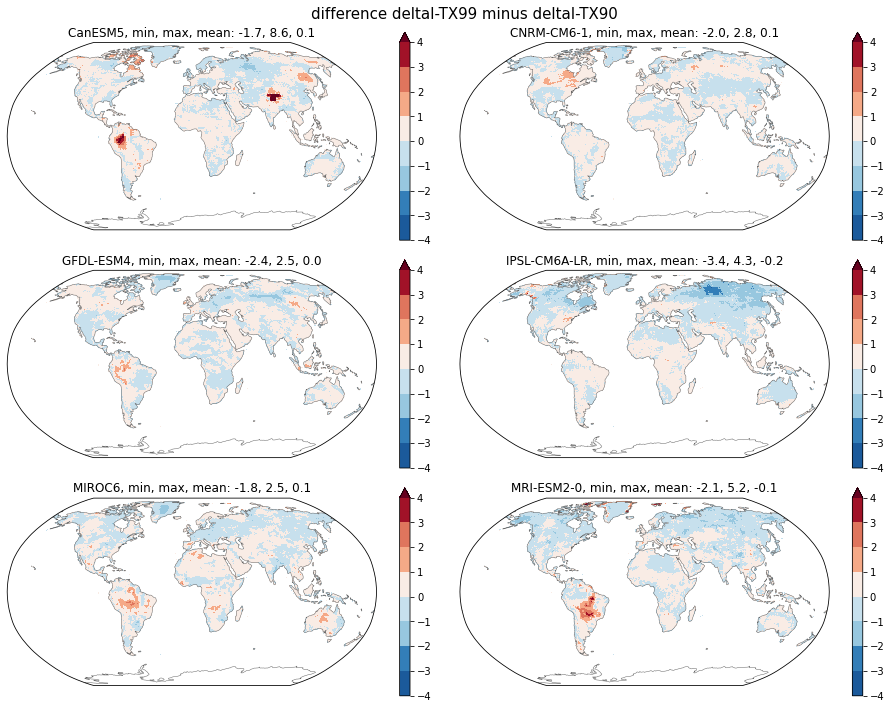

In [53]:
proj = ccrs.Robinson()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 4
levels = np.linspace(-vmax,vmax,num=(vmax*2+1))
cmap = mycmap #'RdBu_r' # mycmap = got rid of white but not enough colors

fig, axes = plt.subplots(3,2,figsize=(13,10), subplot_kw={'projection': proj})
axes = axes.flatten()

for GCM, ax in zip(GCMs, axes):
    data_plot = (da_deltaI_TX99.sel(model=GCM) - da_deltaI_TX90.sel(model=GCM) )*landmask
    data_plot.plot(ax=ax, cmap = cmap, vmax=vmax, transform=crs, levels=levels, extend='max'); #cmap = 'RdBu_r', vmax=250, vmin=-250, transform=crs
    ax.set_title(f'{GCM}, min, max, mean: {data_plot.min():.1f}, {data_plot.max():.1f}, {data_plot.mean():.1f}');
    ax.coastlines(color='dimgray', linewidth=0.5)
    #ax.add_feature(cfeature.BORDERS, facecolor="none", edgecolor='dimgray', linewidth=0.5 )
    
fig.suptitle('difference deltaI-TX99 minus deltaI-TX90', size=15);
fig.tight_layout()

/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/coding/times.py:682: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/apps/brussel/RL8/broadwell/software/xarray/2022.6.0-foss-2022a/lib/python3.10/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(array[self.key], dtype=None)


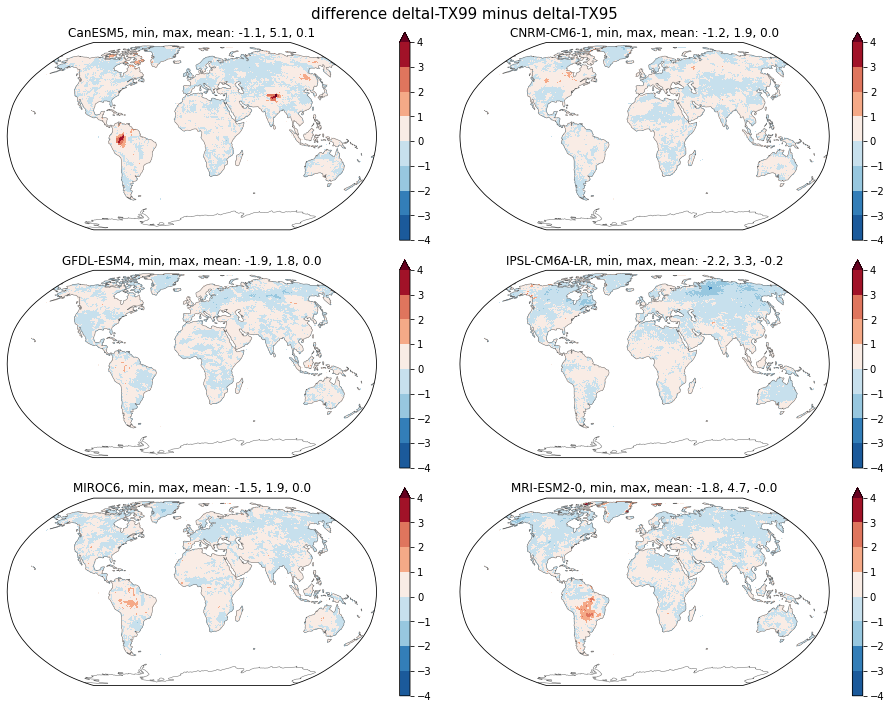

In [54]:
proj = ccrs.Robinson()
landmask = get_mask()
crs = ccrs.PlateCarree()
vmax = 4
levels = np.linspace(-vmax,vmax,num=(vmax*2+1))
cmap = mycmap #'RdBu_r' # mycmap = got rid of white but not enough colors

fig, axes = plt.subplots(3,2,figsize=(13,10), subplot_kw={'projection': proj})
axes = axes.flatten()

for GCM, ax in zip(GCMs, axes):
    data_plot = (da_deltaI_TX99.sel(model=GCM) - da_deltaI_TX95.sel(model=GCM) )*landmask
    data_plot.plot(ax=ax, cmap = cmap, vmax=vmax, transform=crs, levels=levels, extend='max'); #cmap = 'RdBu_r', vmax=250, vmin=-250, transform=crs
    ax.set_title(f'{GCM}, min, max, mean: {data_plot.min():.1f}, {data_plot.max():.1f}, {data_plot.mean():.1f}');
    ax.coastlines(color='dimgray', linewidth=0.5)
    #ax.add_feature(cfeature.BORDERS, facecolor="none", edgecolor='dimgray', linewidth=0.5 )
    
fig.suptitle('difference deltaI-TX99 minus deltaI-TX95', size=15);
fig.tight_layout()

### 3b. compare demographic patterns for crossing delta-I >1,2... 

In [83]:
da_n_people_deltaI_TX99, da_prop_people_deltaI_TX99 = calc_number_proportion_people_atleastdeltaI_10yr(gs_population_global, GCMs, da_deltaI_TX99,  thresholds = [0,0.5,1,1.5,3])
da_n_people_deltaI_TX95, da_prop_people_deltaI_TX95 = calc_number_proportion_people_atleastdeltaI_10yr(gs_population_global, GCMs, da_deltaI_TX95,  thresholds = [0,0.5,1,1.5,3])
da_n_people_deltaI_TX90, da_prop_people_deltaI_TX90 = calc_number_proportion_people_atleastdeltaI_10yr(gs_population_global, GCMs, da_deltaI_TX90,  thresholds = [0,0.5,1,1.5,3])

da_n_people_deltaI_TX99_hi, da_prop_people_deltaI_TX99_hi = calc_number_proportion_people_atleastdeltaI_10yr(gs_population_global, GCMs, da_deltaI_TX99,  thresholds = [1.5,2,2.5,3,3.5])
da_n_people_deltaI_TX95_hi, da_prop_people_deltaI_TX95_hi = calc_number_proportion_people_atleastdeltaI_10yr(gs_population_global, GCMs, da_deltaI_TX95,  thresholds = [1.5,2,2.5,3,3.5])
da_n_people_deltaI_TX90_hi, da_prop_people_deltaI_TX90_hi = calc_number_proportion_people_atleastdeltaI_10yr(gs_population_global, GCMs, da_deltaI_TX90,  thresholds = [1.5,2,2.5,3,3.5])

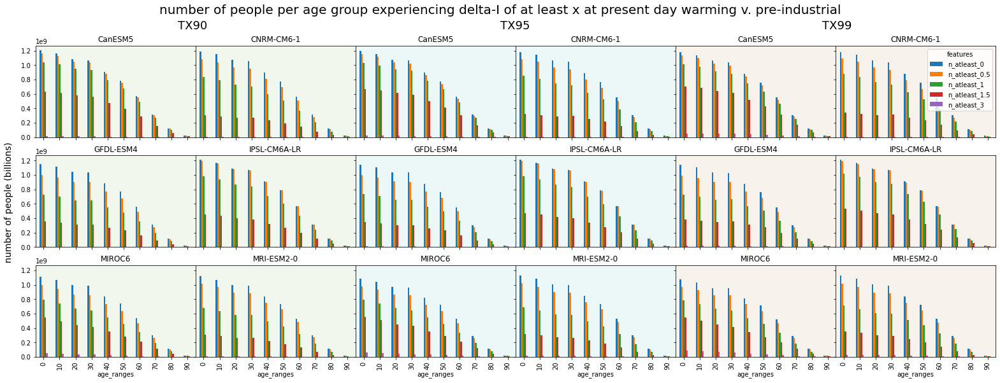

In [65]:
fig, axes = plt.subplots(3,2*3,figsize=(9*3,9),sharex=True, sharey=True)
axes = axes.flatten()


pos=np.array([0, 1, 6, 7, 12, 13])
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    # make legend only appear on one subplot
    leg = False
    # plot 
    data_plot = da_n_people_deltaI_TX90.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=leg)
    ax.set_title(f'{da_n_people_deltaI_TX90.model[i].values}')
    ax.set_facecolor('#f1f7ec')
    
pos=np.array([0, 1, 6, 7, 12, 13])+2
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    # make legend only appear on one subplot
    leg = False
    # plot 
    data_plot = da_n_people_deltaI_TX95.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=leg)
    ax.set_title(f'{da_n_people_deltaI_TX95.model[i].values}')
    ax.set_facecolor('#Ecf7f7')
    
pos=np.array([0, 1, 6, 7, 12, 13])+4
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    # make legend only appear on one subplot
    leg = True if i == 1 else False
    # plot 
    data_plot = da_n_people_deltaI_TX99.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=leg)
    ax.set_title(f'{da_n_people_deltaI_TX99.model[i].values}')
    ax.set_facecolor('#f7f3ec')
    
fig.suptitle('number of people per age group experiencing delta-I of at least x at present day warming v. pre-industrial\n \n', size=20)
fig.supylabel('number of people (billions)', x=0.1,size=14);

fig.text(0.24,0.92,'TX90',size=18);
fig.text(0.5,0.92,'TX95',size=18);
fig.text(0.76,0.92,'TX99',size=18);
fig.subplots_adjust(wspace=0, hspace=None)

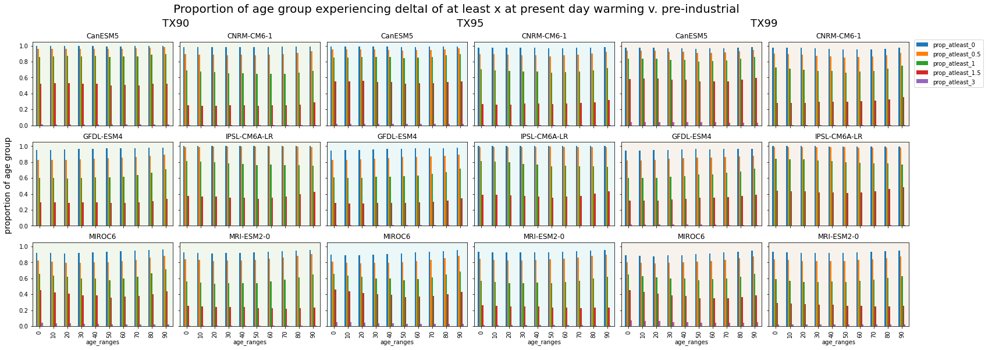

In [66]:
fig, axes = plt.subplots(3,2*3,figsize=(9*3,9),sharex=True, sharey=True)
axes = axes.flatten()

# Create an empty list to store handles for legends
legend_handles = []


pos=np.array([0, 1, 6, 7, 12, 13])
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    # plot 
    data_plot = da_prop_people_deltaI_TX90.sel(model=GCM)
    handles, labels = data_plot.to_pandas().plot.bar(ax=ax, legend=False).get_legend_handles_labels()
    legend_handles.extend(handles)
    ax.set_title(f'{da_prop_people_deltaI_TX90.model[i].values}')
    ax.set_facecolor('#f1f7ec')
    
pos=np.array([0, 1, 6, 7, 12, 13])+2
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    data_plot = da_prop_people_deltaI_TX95.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=False)
    ax.set_title(f'{da_prop_people_deltaI_TX95.model[i].values}')
    ax.set_facecolor('#Ecf7f7')
    
pos=np.array([0, 1, 6, 7, 12, 13])+4
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    data_plot = da_prop_people_deltaI_TX99.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=False)
    ax.set_title(f'{da_prop_people_deltaI_TX99.model[i].values}')
    ax.set_facecolor('#f7f3ec')
    
fig.suptitle('Proportion of age group experiencing deltaI of at least x at present day warming v. pre-industrial\n \n', size=20)
fig.supylabel('proportion of age group', x=0.1,size=14);

fig.text(0.24,0.92,'TX90',size=18);
fig.text(0.5,0.92,'TX95',size=18);
fig.text(0.76,0.92,'TX99',size=18);
fig.subplots_adjust(wspace=0.05, hspace=None)

# Create a common legend outside the subplots
fig.legend(legend_handles, labels, loc=(.915,.75), ncol=1)

#### higher values 

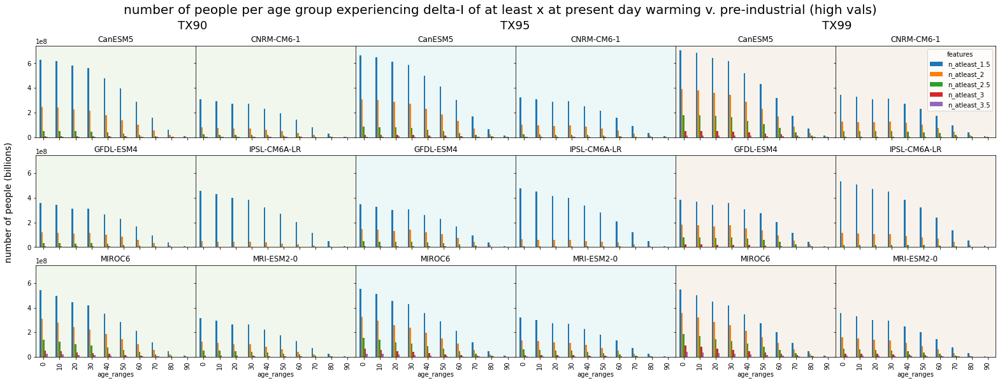

In [84]:
fig, axes = plt.subplots(3,2*3,figsize=(9*3,9),sharex=True, sharey=True)
axes = axes.flatten()


pos=np.array([0, 1, 6, 7, 12, 13])
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    # make legend only appear on one subplot
    leg = False
    # plot 
    data_plot = da_n_people_deltaI_TX90_hi.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=leg)
    ax.set_title(f'{da_n_people_deltaI_TX90_hi.model[i].values}')
    ax.set_facecolor('#f1f7ec')
    
pos=np.array([0, 1, 6, 7, 12, 13])+2
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    # make legend only appear on one subplot
    leg = False
    # plot 
    data_plot = da_n_people_deltaI_TX95_hi.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=leg)
    ax.set_title(f'{da_n_people_deltaI_TX95_hi.model[i].values}')
    ax.set_facecolor('#Ecf7f7')
    
pos=np.array([0, 1, 6, 7, 12, 13])+4
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    # make legend only appear on one subplot
    leg = True if i == 1 else False
    # plot 
    data_plot = da_n_people_deltaI_TX99_hi.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=leg)
    ax.set_title(f'{da_n_people_deltaI_TX99_hi.model[i].values}')
    ax.set_facecolor('#f7f3ec')
    
fig.suptitle('number of people per age group experiencing delta-I of at least x at present day warming v. pre-industrial (high vals)\n \n', size=20)
fig.supylabel('number of people (billions)', x=0.1,size=14);

fig.text(0.24,0.92,'TX90',size=18);
fig.text(0.5,0.92,'TX95',size=18);
fig.text(0.76,0.92,'TX99',size=18);
fig.subplots_adjust(wspace=0, hspace=None)

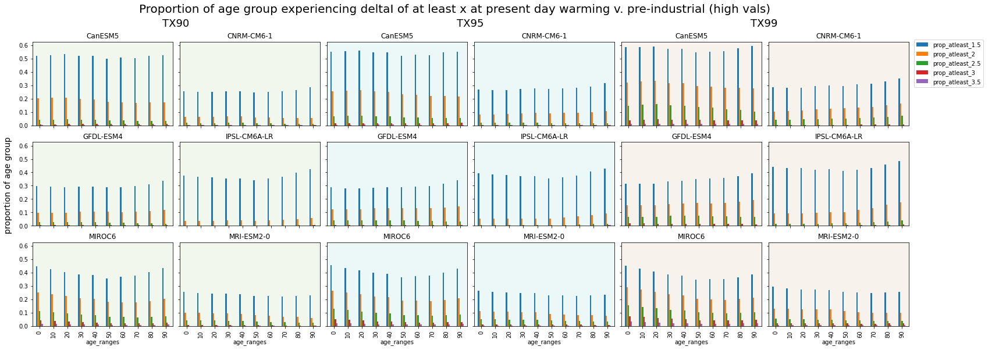

In [85]:
fig, axes = plt.subplots(3,2*3,figsize=(9*3,9),sharex=True, sharey=True)
axes = axes.flatten()

# Create an empty list to store handles for legends
legend_handles = []


pos=np.array([0, 1, 6, 7, 12, 13])
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    # plot 
    data_plot = da_prop_people_deltaI_TX90_hi.sel(model=GCM)
    handles, labels = data_plot.to_pandas().plot.bar(ax=ax, legend=False).get_legend_handles_labels()
    legend_handles.extend(handles)
    ax.set_title(f'{da_prop_people_deltaI_TX90_hi.model[i].values}')
    ax.set_facecolor('#f1f7ec')
    
pos=np.array([0, 1, 6, 7, 12, 13])+2
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    data_plot = da_prop_people_deltaI_TX95_hi.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=False)
    ax.set_title(f'{da_prop_people_deltaI_TX95_hi.model[i].values}') # can standardize this for all plots plt.title(f'{data_plot.model}') - and make a whole function for this plot that just takes the 3 datasets ! and title/ylabel
    ax.set_facecolor('#Ecf7f7')
    
pos=np.array([0, 1, 6, 7, 12, 13])+4
axes_sel = axes[pos]
for i, (GCM, ax) in enumerate(zip(GCMs, axes_sel)):
    data_plot = da_prop_people_deltaI_TX99_hi.sel(model=GCM)
    data_plot.to_pandas().plot.bar(ax=ax, legend=False)
    ax.set_title(f'{da_prop_people_deltaI_TX99_hi.model[i].values}')
    ax.set_facecolor('#f7f3ec')
    
fig.suptitle('Proportion of age group experiencing deltaI of at least x at present day warming v. pre-industrial (high vals) \n \n', size=20)
fig.supylabel('proportion of age group', x=0.1,size=14);

fig.text(0.24,0.92,'TX90',size=18);
fig.text(0.5,0.92,'TX95',size=18);
fig.text(0.76,0.92,'TX99',size=18);
fig.subplots_adjust(wspace=0.05, hspace=None)

# Create a common legend outside the subplots
fig.legend(legend_handles, labels, loc=(.915,.75), ncol=1)

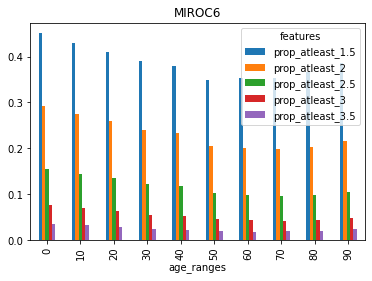

In [87]:
data_plot = da_prop_people_deltaI_TX99_hi.sel(model='MIROC6')
data_plot.to_pandas().plot.bar(legend=True)
plt.title(f'{data_plot.model}')
plt.show()

# zoom in to see at a bit more in detail 